In [1]:
#import spatialdata as sd
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import scanpy as sc
import squidpy as sq
import anndata as ad
from matplotlib.colors import ListedColormap


/software/cellgen/team298/ls34/NEMO2/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/software/cellgen/team298/ls34/NEMO2/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
sc.settings.set_figure_params(dpi=50,dpi_save=300, facecolor="white", frameon=False, figsize=(18,18))


In [3]:
# """
# pre-reintegration
# """
# #PATH ='/nfs/team298/ls34/xenium_atlas/model_eczema_plus_psoriasis_scanvi_ALL/adata_counts_integrated.h5ad.clustered.psoriasionly.reclustered.reannotatedTcell.annotated9_fa5'
# """
# post
# """
# PATH = '/nfs/team298/ls34/adult_skin/final_adatas/adata_xenium_v2.h5ad.final'
# # adata_5k=adata_5k[adata_5k.obs["disease_overall"]=="Psoriasis"]
# # adata_5k.obs["info_id"].value_counts()

# #PATH='/nfs/team298/ls34/new_disease_atlas/final_adatas/adata_xeniumONLY_14final.h5ad'

# #'/nfs/team298/ls34/new_disease_atlas/final_adatas/adata_xeniumONLY_14final.h5ad')
# #PATH='/nfs/team298/ls34/adult_skin/final_adatas/adata_xenium_v1.h5ad.final'
# # import scanpy as sc
# # adata_5k=sc.read_h5ad('/nfs/team298/ls34/adult_skin/final_adatas/adata_xenium_v3.h5ad.final.timepointsforpaper')
# # adata_5k=adata_5k[adata_5k.obs["disease_overall"]=="Psoriasis"]
# # adata_5k.obs["info_id"].value_counts()
# adata=sc.read_h5ad(PATH)
# def remove_markers(LIST):
#     try: 
#         LIST = {key: [gene for gene in genes if gene in adata_5k.var_names] 
#                            for key, genes in LIST.items()}
#     except: 
#         LIST =[gene for gene in LIST if gene in adata_5k.var_names]
#     return LIST






# #adata_5k=adata
# adata_5k.obs["Annotation"]=adata_5k.obs["lvl4_annotation"]


In [4]:
# adata_5k.obs["Sanger patient ID"].value_counts()

In [41]:
PATH = '/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final'
adata=sc.read_h5ad(PATH)
adata.obs["Site_status"].value_counts()

Site_status
Non-lesional                        365835
Validation_dataset                  295228
Lesional                            231620
3D_Week12                           180311
3D_Lesional_baseline                153479
Week 12                             149277
Psoriasis_replicate_PostRx          101005
Psoriasis_replicate_non-lesional     76048
Week 8 Psoriasis                     72094
Psoriasis_replicate_Lesional         60647
Healthy                              59315
Day 14_HF                            30438
Name: count, dtype: int64

In [45]:
adata_5k.obs["Site_status"].value_counts()

Site_status
Non-lesional                        365835
Validation_dataset                  295228
Lesional                            231620
3D_Week12                           180311
3D_Lesional_baseline                153479
Week 12                             149277
Psoriasis_replicate_PostRx          101005
Psoriasis_replicate_non-lesional     76048
Week 8 Psoriasis                     72094
Psoriasis_replicate_Lesional         60647
Healthy                              59315
Day 14_HF                            30438
Name: count, dtype: int64

In [46]:
adata_5k = adata_5k [ adata_5k.obs["Site_status"]=="Validation_dataset"]

In [50]:
adata_5k.obs.info_id6.value_counts()

info_id6
BK51-SKI-27-FO-2-S4-S8-S6      27222
CE4-SKI-27-FO-1-S25-S29-S32    26668
BK23-SKI-27-FO-5-S9-A2         23077
BK30-SKI-28-FO-1-S14-C2        22663
BK27-SKI-27-FO-5-S9-D1         22490
BK27-SKI-27-FO-1-S6-C1         20832
BK39-SKI-27-FO-1-S8-D2         19424
BK23-SKI-27-FO-1-S8-B1         19076
BK22-SKI-27-FO-2-S7-A1         16642
BK21-SKI-27-FO1-S11-C1         16370
BK51-SKI-27-FO-2-S9-B2         15972
BK30-SKI-28-FO-1-S6-B2         15729
CE3-SKI-28-FO-1-S28-D2         11425
BK21-SKI-27-FO-1-S8-A3         10603
CE3-SKI-28-FO-1-S25-D1          9718
BK21-SKI-27-FO-1-S13-C2         9244
CE3-SKI-28-FO-1-S25-E1          8073
Name: count, dtype: int64

In [49]:
adata_5k.obs.sample_id.value_counts()

sample_id
BK51-SKI-27-FO-2-S4-S8-S6      27222
CE4-SKI-27-FO-1-S25-S29-S32    26668
BK23-SKI-27-FO-5-S9-A2         23077
BK30-SKI-28-FO-1-S14-C2        22663
BK27-SKI-27-FO-5-S9-D1         22490
BK27-SKI-27-FO-1-S6-C1         20832
BK39-SKI-27-FO-1-S8-D2         19424
BK23-SKI-27-FO-1-S8-B1         19076
BK22-SKI-27-FO-2-S7-A1         16642
BK21-SKI-27-FO1-S11-C1         16370
BK51-SKI-27-FO-2-S9-B2         15972
BK30-SKI-28-FO-1-S6-B2         15729
CE3-SKI-28-FO-1-S28-D2         11425
BK21-SKI-27-FO-1-S8-A3         10603
CE3-SKI-28-FO-1-S25-D1          9718
BK21-SKI-27-FO-1-S13-C2         9244
CE3-SKI-28-FO-1-S25-E1          8073
Name: count, dtype: int64

0 True
CE4-SKI-27-FO-1-S25-S29-S32 - Cell count:  2


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


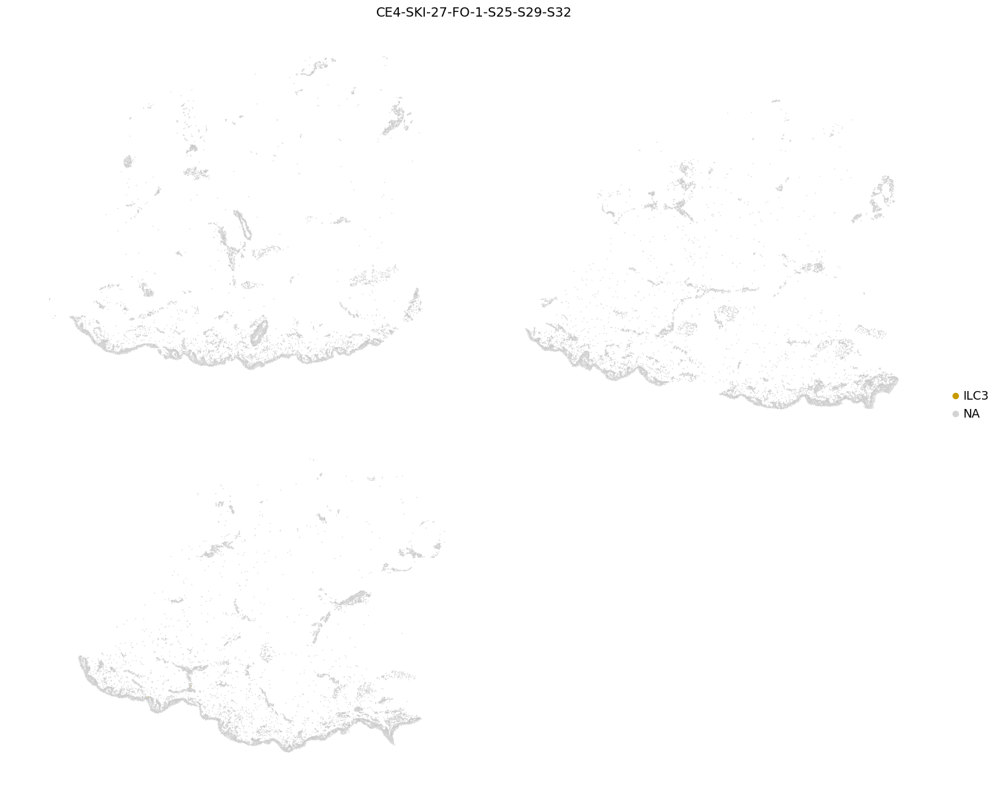

1 True
BK51-SKI-27-FO-2-S4-S8-S6 - Cell count:  8


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


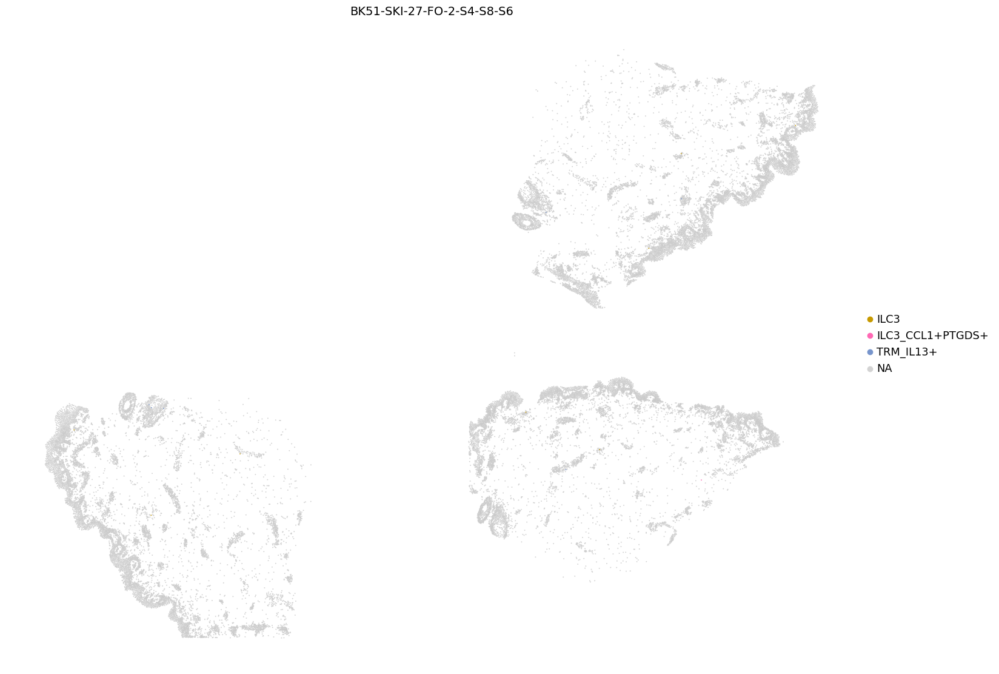

2 True
BK30-SKI-28-FO-1-S6-B2 - Cell count:  8


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


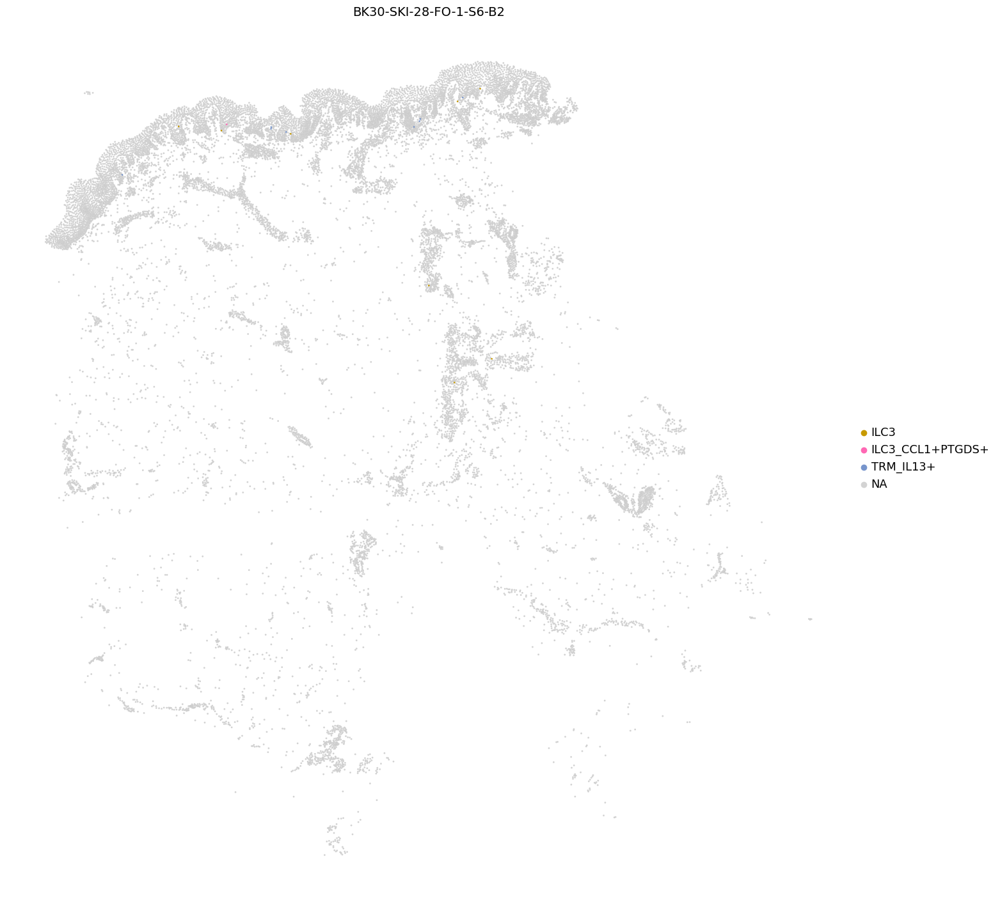

3 True
BK22-SKI-27-FO-2-S7-A1 - Cell count:  2


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


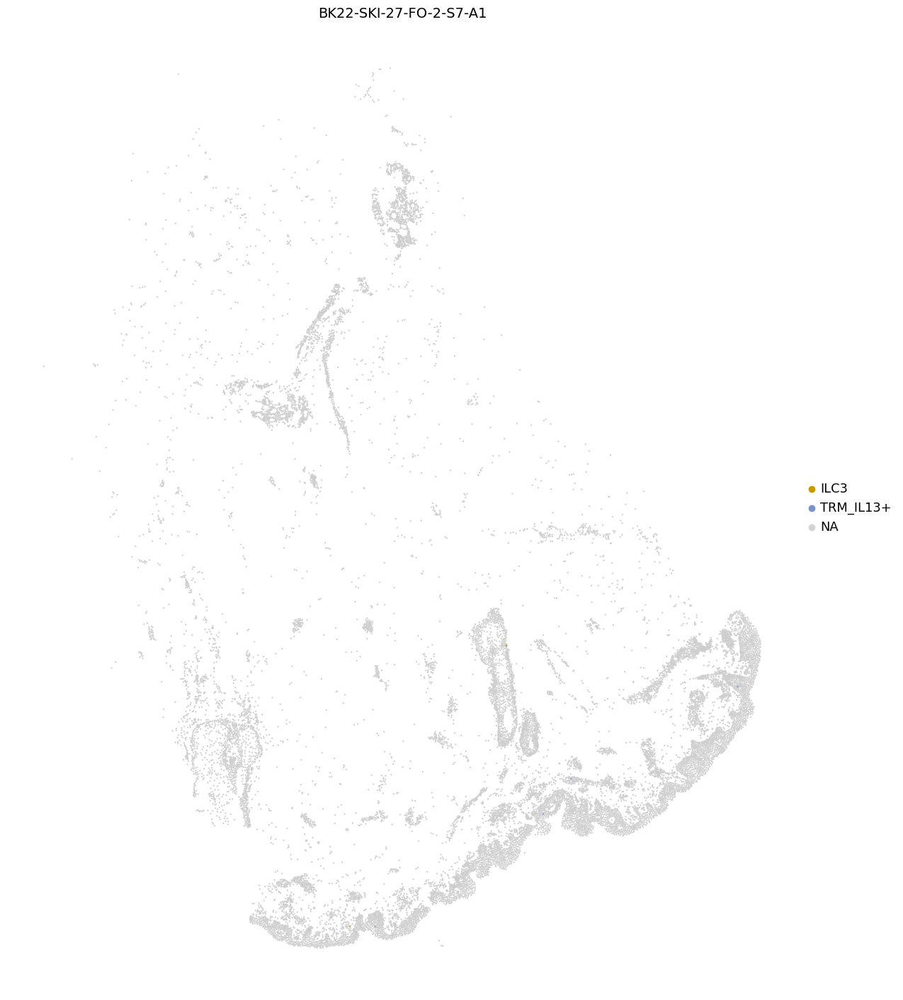

4 True
BK30-SKI-28-FO-1-S14-C2 - Cell count:  9


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


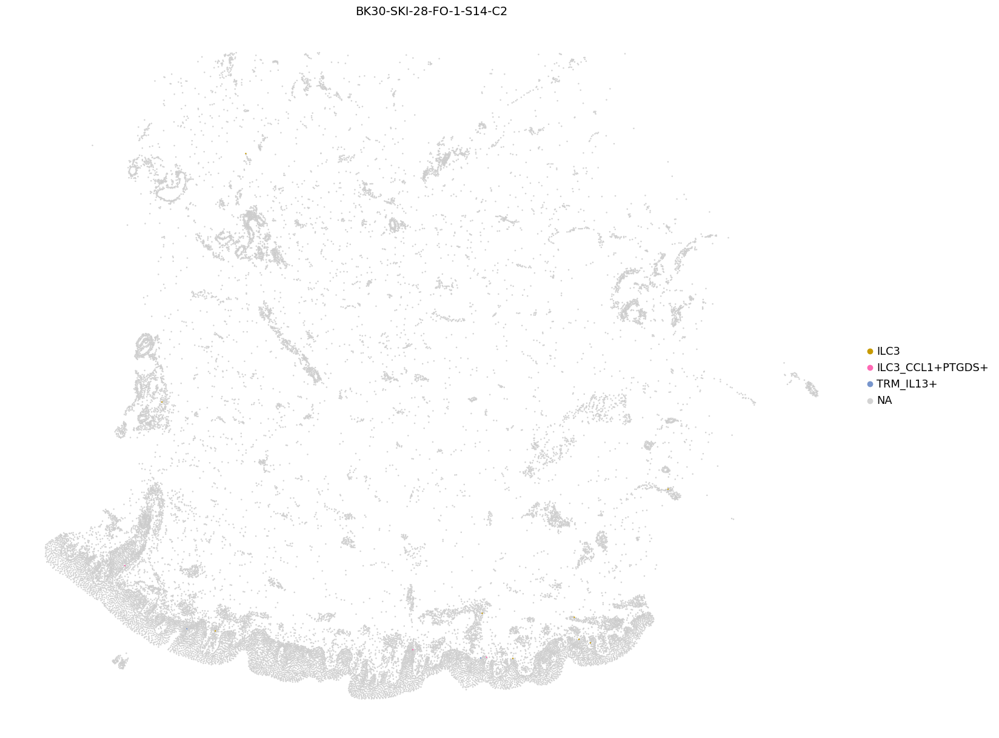

5 True
BK27-SKI-27-FO-5-S9-D1 - Cell count:  11


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


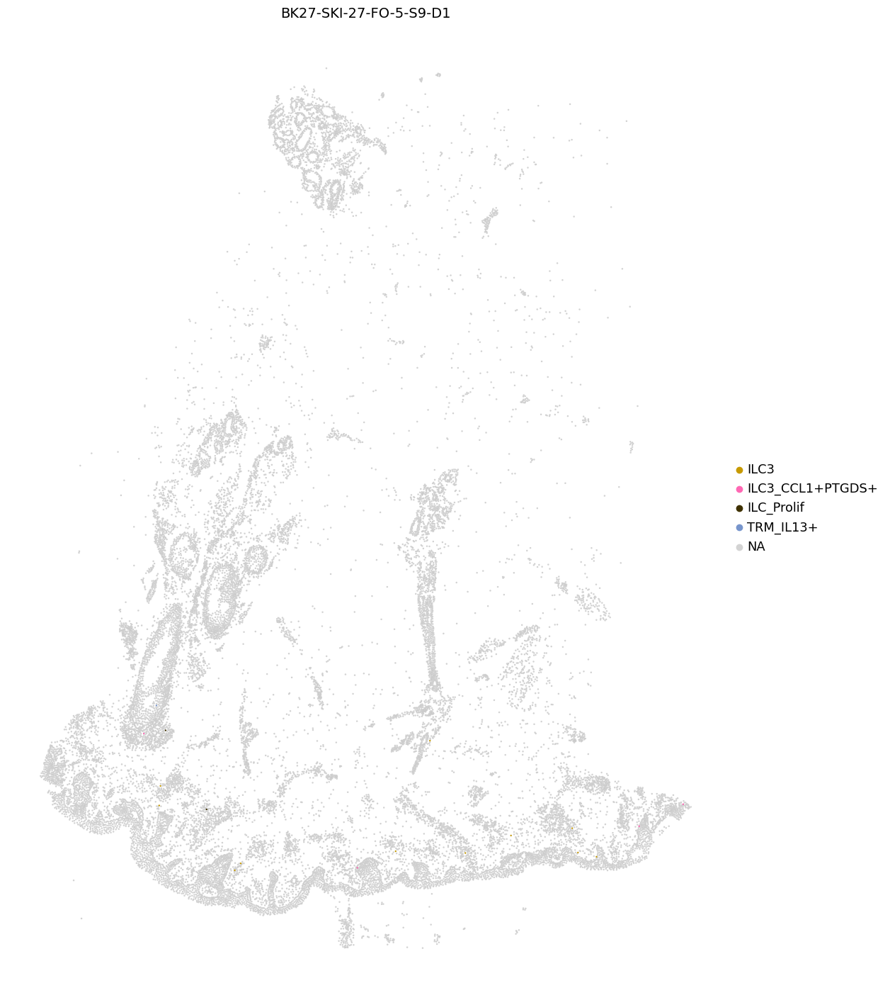

6 True
CE3-SKI-28-FO-1-S25-D1 - Cell count:  11


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


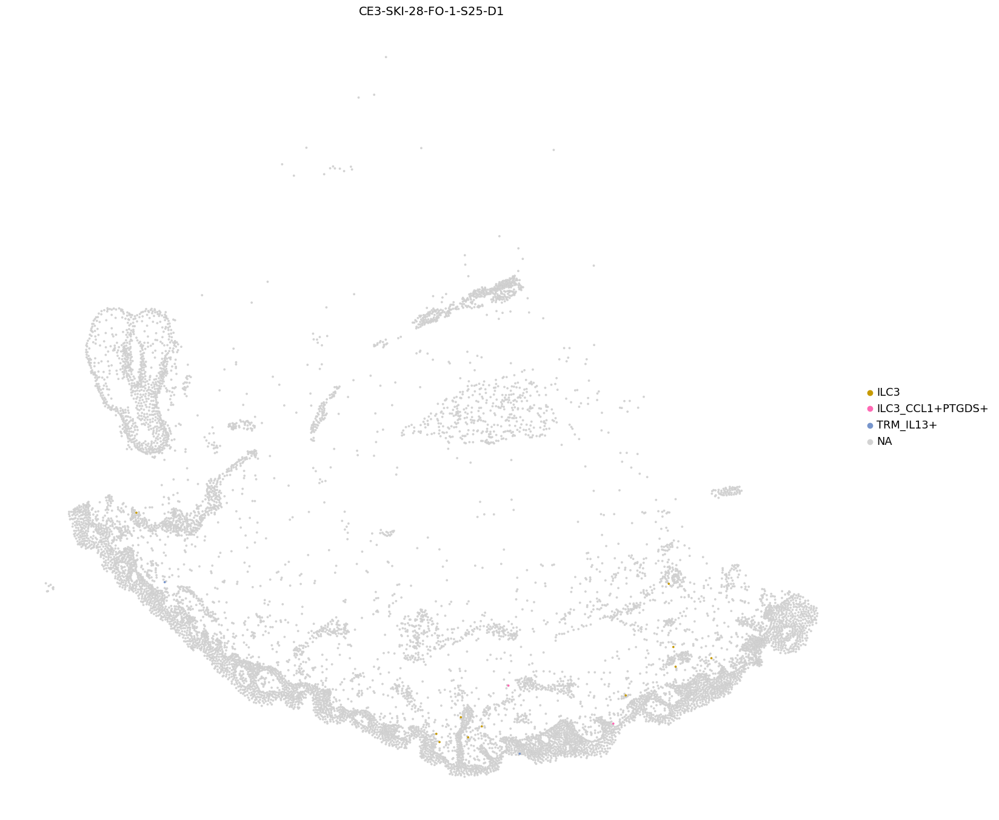

7 True
CE3-SKI-28-FO-1-S28-D2 - Cell count:  9


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


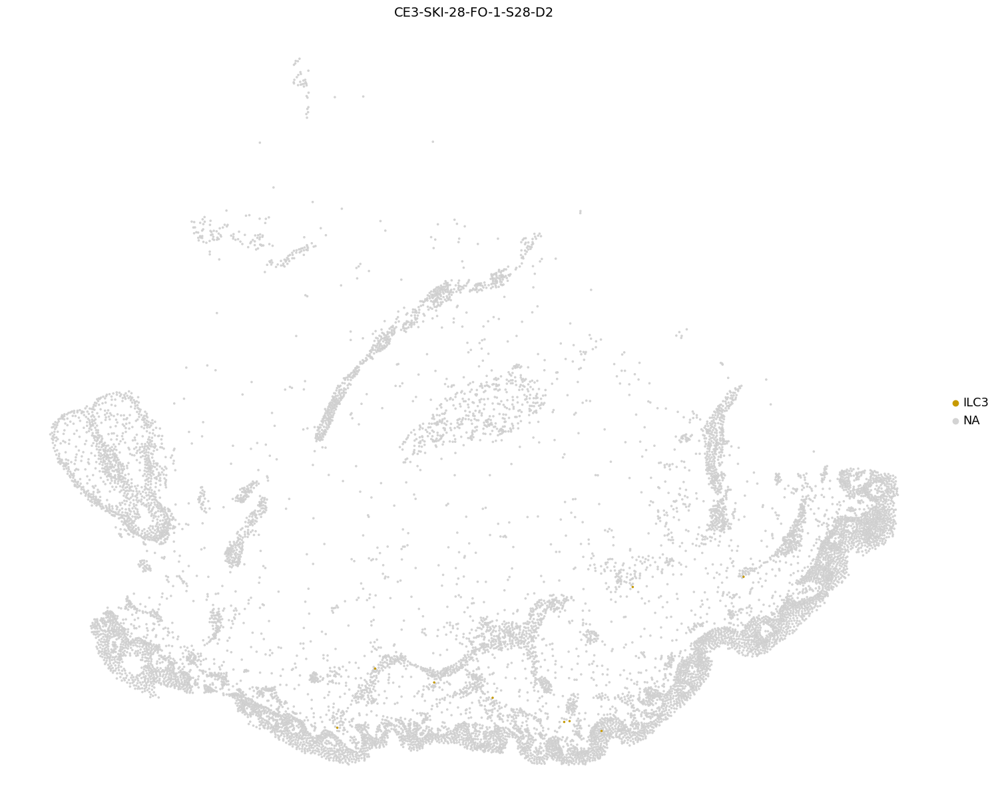

8 True
BK21-SKI-27-FO-1-S13-C2 - Cell count:  1


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


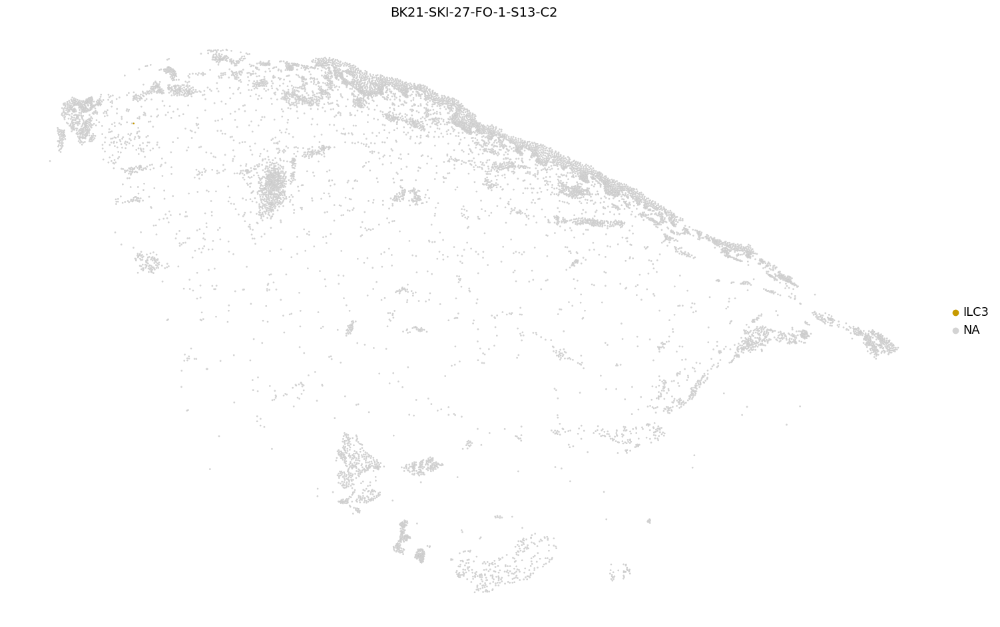

9 True
BK23-SKI-27-FO-1-S8-B1 - Cell count:  4


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


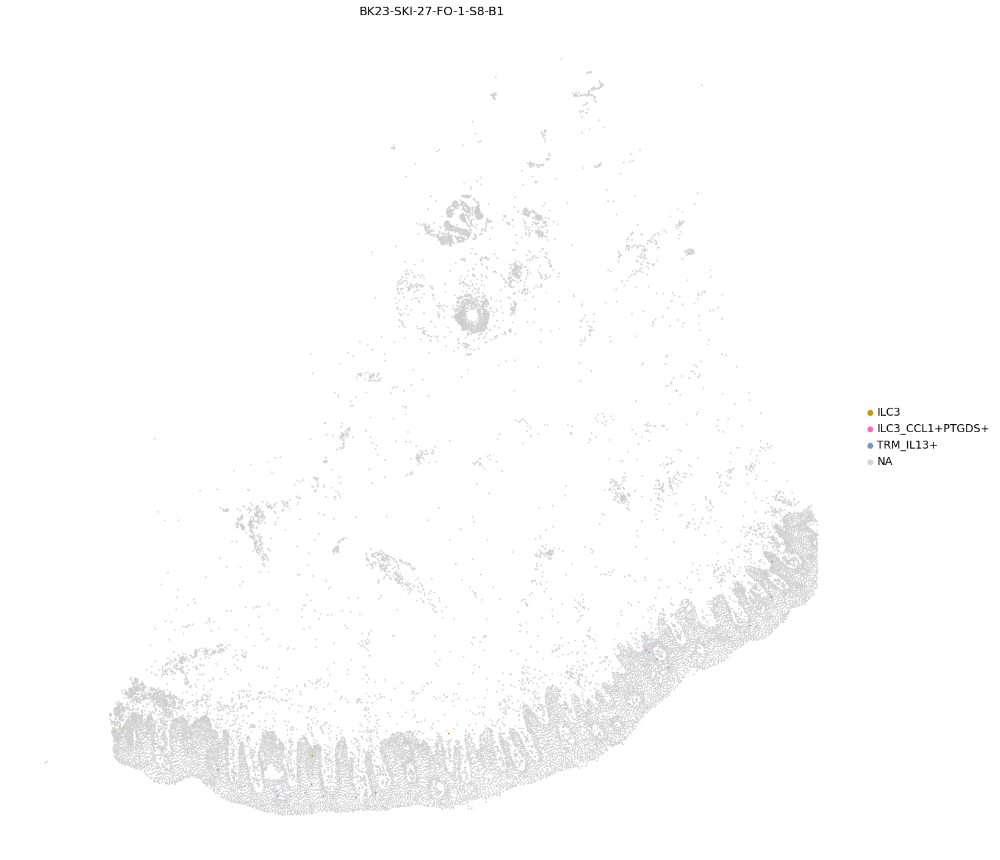

10 True
BK21-SKI-27-FO1-S11-C1 - Cell count:  2


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


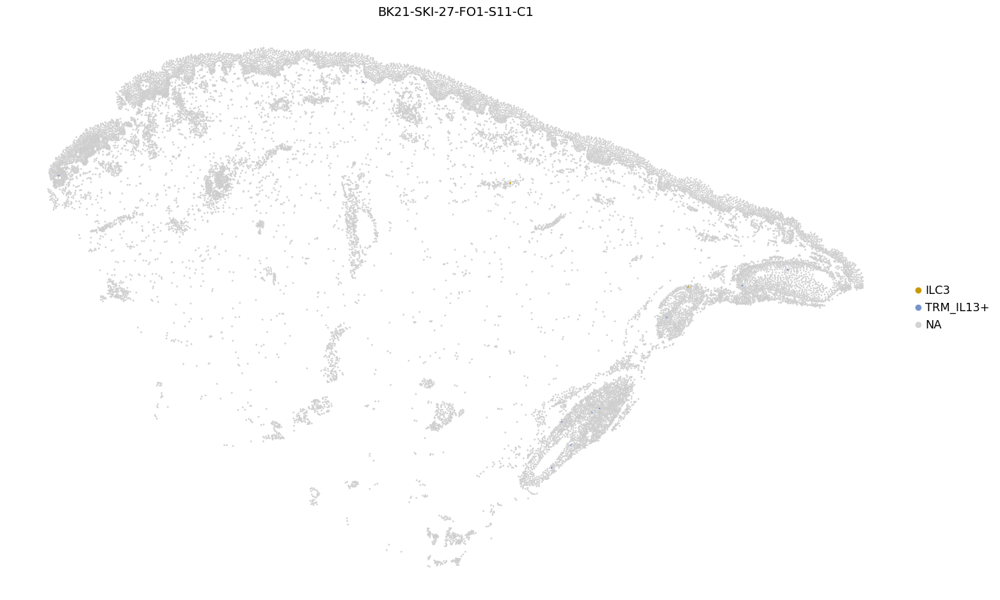

11 True
BK51-SKI-27-FO-2-S9-B2 - Cell count:  3


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


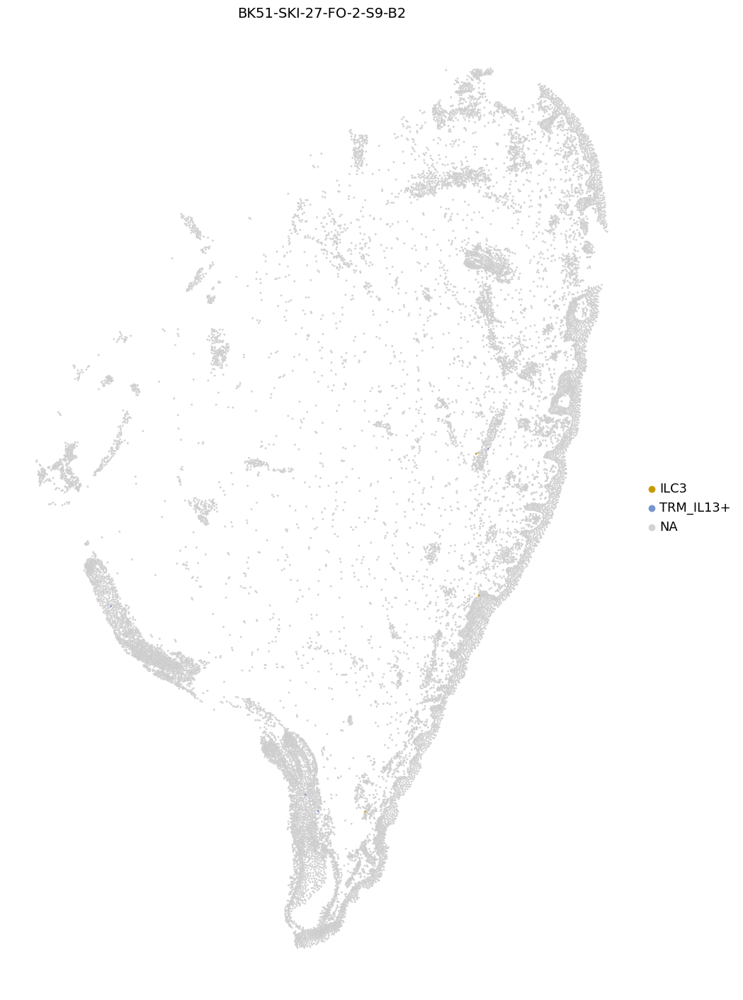

12 True
BK21-SKI-27-FO-1-S8-A3 - Cell count:  7


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


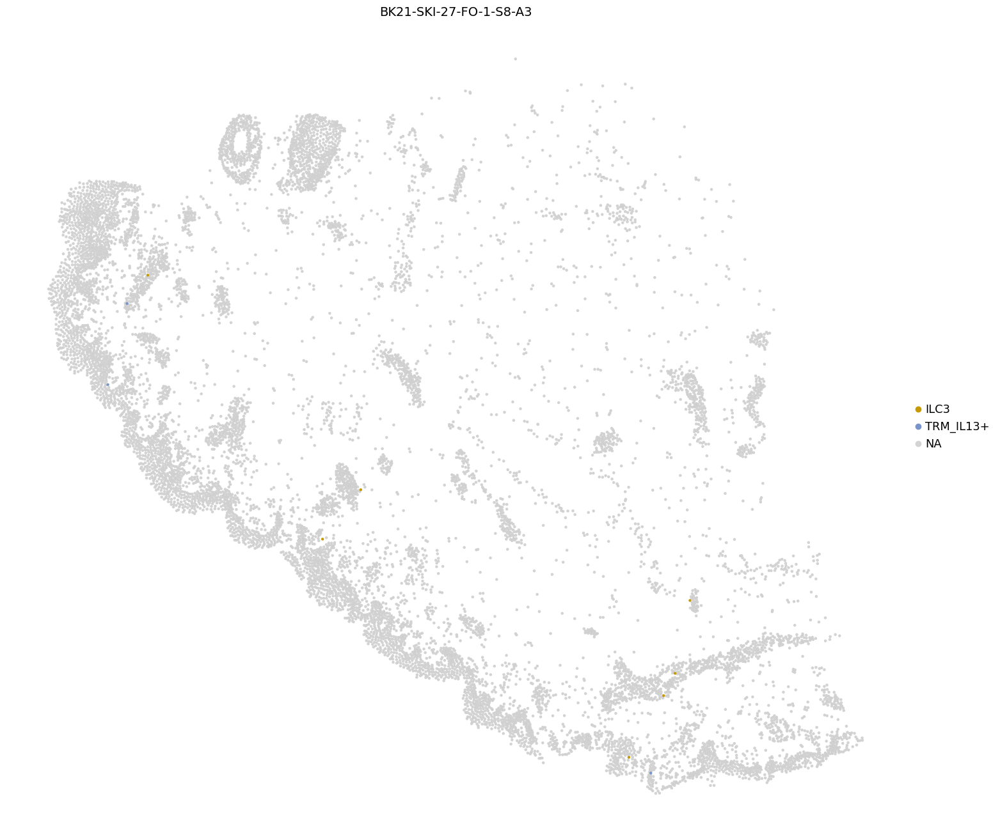

13 True
BK39-SKI-27-FO-1-S8-D2 - Cell count:  5


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


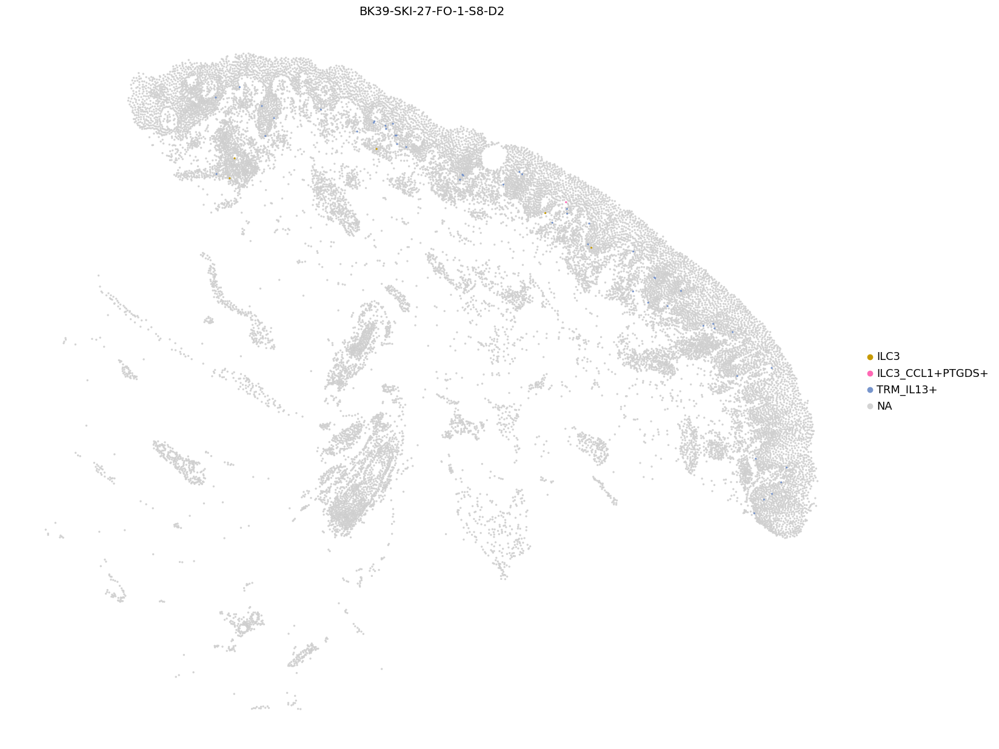

14 True
BK27-SKI-27-FO-1-S6-C1 - Cell count:  4


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


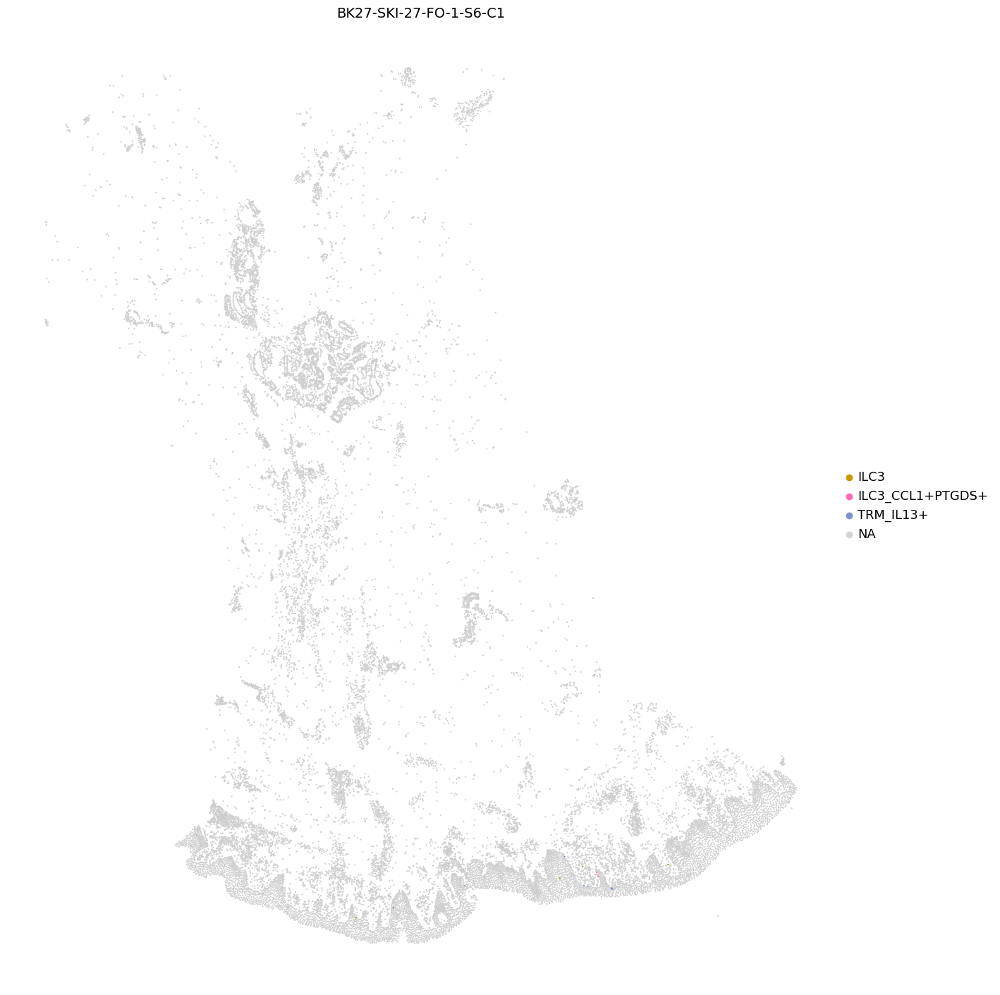

15 True
CE3-SKI-28-FO-1-S25-E1 - Cell count:  7


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


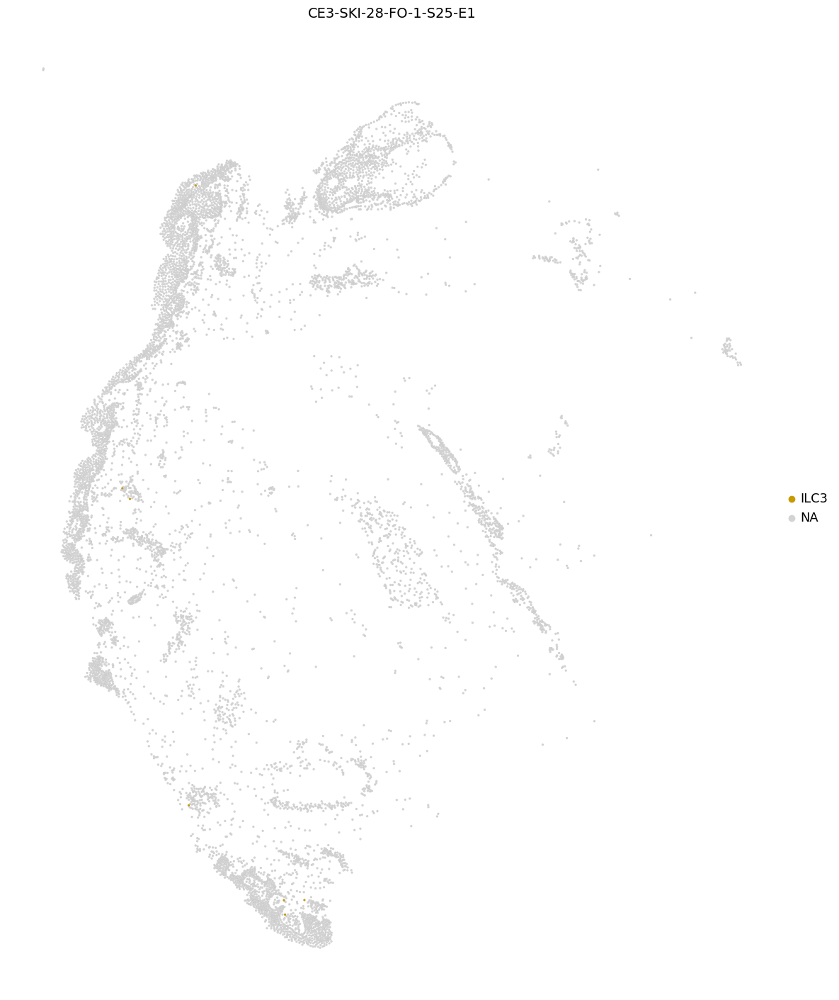

16 True
BK23-SKI-27-FO-5-S9-A2 - Cell count:  4


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


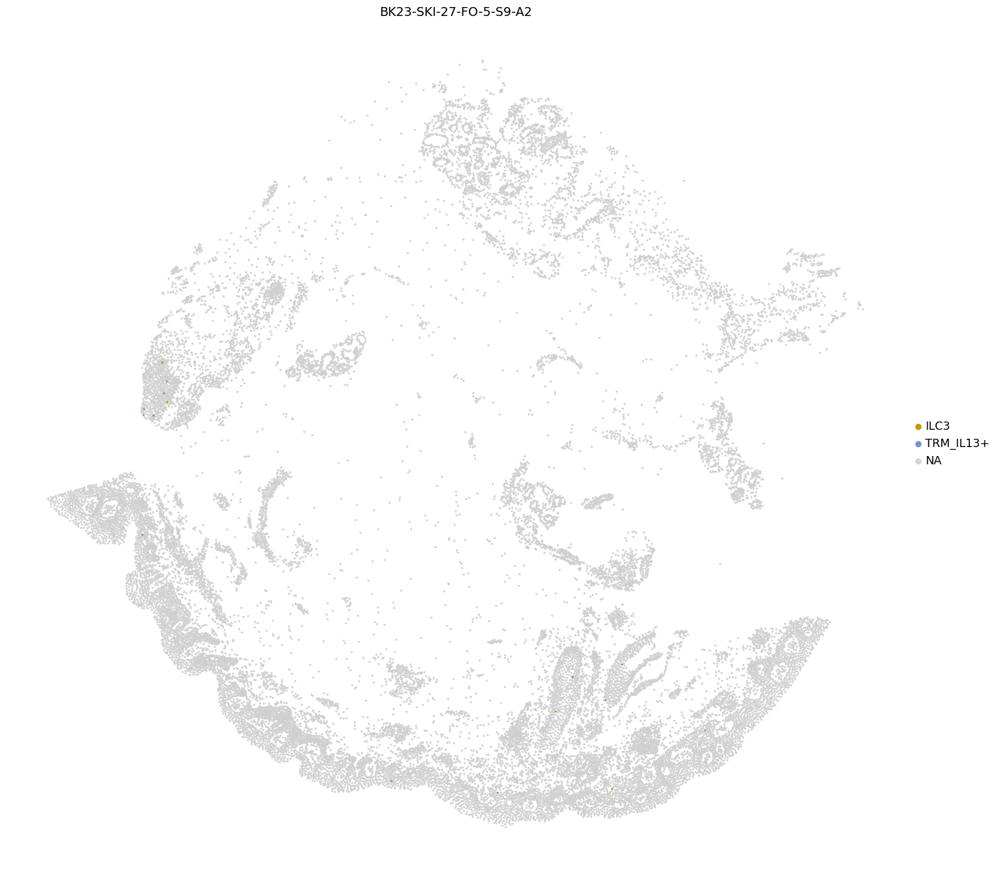

In [51]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3")][0]
MIN_CELL_COUNT=0


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs.info_id6.unique():
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["lvl5_annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["lvl5_annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="lvl5_annotation",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    #palette=custom_palette,
              #  palette=colors,
                groups=["ILC3", "ILC3_CCL1+PTGDS+", "ILC_Prolif", "TRM_IL13+",# "TRM_IL17+"
                       ],
                    edgecolor='black',
                    linewidth=0.01,
                #save=f"ILC3_location_{tissue_section_id}.pdf"

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [54]:
2

2

In [ ]:
adata[adata.obs["Site_status"]=="Validation_dataset"].obs.tech.value_counts()

In [44]:
adata_5k=adata[adata.obs["tech"]=="xenium"].copy()
adata_5k.obs["Site_status"].value_counts()

Site_status
Non-lesional                        365835
Validation_dataset                  295228
Lesional                            231620
3D_Week12                           180311
3D_Lesional_baseline                153479
Week 12                             149277
Psoriasis_replicate_PostRx          101005
Psoriasis_replicate_non-lesional     76048
Week 8 Psoriasis                     72094
Psoriasis_replicate_Lesional         60647
Healthy                              59315
Day 14_HF                            30438
Name: count, dtype: int64

In [12]:
#adata=sc.read_h5ad('/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.v8_nohealthy')
#PATH = '/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final'
#PATH = '/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final.filtered'
#adata=sc.read_h5ad(PATH)
adata_5k=adata[adata.obs["tech"]=="xenium"].copy()
adata=adata[adata.obs["tech"]!="xenium"].copy()

#adata=sc.read_h5ad('/nfs/team298/ls34/adult_skin/final_adatas/adata_combined_new.h5ad.final.filtered.scrna')

import gc
gc.collect()


#adata=sc.read_h5ad(PATH2)
def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata.var_names]
    return LIST

 


# adata_5k=sc.read_h5ad(PATH)
# # adata_5k.obs["Timepoint2"].value_counts()
# #adata_5k=sc.read_h5ad('/nfs/team298/ls34/adult_skin/final_adatas/adata_xenium_v1.h5ad.final')
# def remove_markers(LIST):
#     try: 
#         LIST = {key: [gene for gene in genes if gene in adata_5k.var_names] 
#                            for key, genes in LIST.items()}
#     except: 
#         LIST =[gene for gene in LIST if gene in adata_5k.var_names]
#     return LIST




# adata_5k



In [40]:
adata.obs.Site_status.value_counts()

Site_status
Lesional    361514
Name: count, dtype: int64

In [6]:
{x:x for x in sorted(adata_5k.obs["lvl5_annotation"].unique())}

{'Adipocyte': 'Adipocyte',
 'Bcell': 'Bcell',
 'F1: Superficial': 'F1: Superficial',
 'F2/3: Perivascular': 'F2/3: Perivascular',
 'F2: Universal': 'F2: Universal',
 'F3: FRC-like': 'F3: FRC-like',
 'F4: DP_HHIP+': 'F4: DP_HHIP+',
 'F4: DS_DPEP1+': 'F4: DS_DPEP1+',
 'F4: TNN+COCH+': 'F4: TNN+COCH+',
 'F5: NGFR+': 'F5: NGFR+',
 'F5: RAMP1+': 'F5: RAMP1+',
 'F6: Inflammatory myofibroblast': 'F6: Inflammatory myofibroblast',
 'ILC1': 'ILC1',
 'ILC1_NCR2+P2RX7+': 'ILC1_NCR2+P2RX7+',
 'ILC2': 'ILC2',
 'ILC3': 'ILC3',
 'ILC3_CCL1+PTGDS+': 'ILC3_CCL1+PTGDS+',
 'ILC_Prolif': 'ILC_Prolif',
 'KC': 'KC',
 'KC1': 'KC1',
 'KC1-2_cycling': 'KC1-2_cycling',
 'KC2': 'KC2',
 'KC2/3_cycling': 'KC2/3_cycling',
 'KC3': 'KC3',
 'KC4': 'KC4',
 'KC5': 'KC5',
 'KC_HF: HFSC': 'KC_HF: HFSC',
 'KC_HF: HS': 'KC_HF: HS',
 'KC_HF: IRS0': 'KC_HF: IRS0',
 'KC_HF: IRS1': 'KC_HF: IRS1',
 'KC_HF: IRS_Cuticle': 'KC_HF: IRS_Cuticle',
 'KC_HF: Matrix': 'KC_HF: Matrix',
 'KC_HF: ORS0': 'KC_HF: ORS0',
 'KC_HF: ORS1': 'KC_HF:

In [36]:


colors = {'Adipocyte': '#B8860B',
 'F1: Superficial': '#FFFFE4',
 'F1: Regenerative': '#FFFFE4',
 'F2/3: Perivascular': '#78b5d7',
 'F2: Universal': '#d0e1f2',
 'F3: FRC-like': '#fbd4d7',
 'F4: DS_DPEP1+': '#d3eec9',
 'F4: TNN+COCH+': '#80ca80',
 'F5: NGFR+': '#788bd2',
 'F5: RAMP1+': '#9e99c9',
 'F6: Inflammatory myofibroblast': '#00ffff',
 'KC1/2': '#505aa1',
 'KC2/3_cycling': '#007FFF',
 'KC_cycling': '#007FFF',
 'KC3': '#839edd',
 'KC4': '#b1dae6',
 'KC5': '#272c5f',
 'KC_HF: Basal': '#006400',
 'KC_HF: m': '#abe8bd',
 'KC_HF: HS': '#abe8bd',
 'KC_HF: IRS+HS': '#abe8bd',
 'KC_SebocyteGland_Outer': '#fe5e00',
 'KC_SebocyteGland_Inner': '#ffff33',
 'KC_SebocyteDuct_Outer/HF_Junction': '#5C430F',
 'KC_SebocyteDuct_Outer': '#958159',
 'KC_SebocyteDuct_Inner': '#f6d7b0',
 'KC_HF: ORS0': '#003200',
 'KC_HF: ORS1': '#9ad295',
 'KC_HF: ORS1/2': '#9ad295',
 'KC_HF: ORS2': '#e7f9e5',
 'KC_HF: IRS': '#ff083a',
 'KC_HF: IRS_cycling': '#FF849D',
 'KC: HF ORS1/2': '#94cb72',
 'KC_HF: IRS+HS_medulla': '#94cb72',
 'KC_HF: IRS_TCHH+': '#990523',
 'KC_SC: LGR6+ACTA2+': '#008080',
 'KCinflamm_basal/int': '#f4e9ef',
 'KCinflamm_late': '#D49BB1',
 'LC': '#63D7F0',
 'LC_SLC18A2+': '#3bc1d9',
 'LE': '#FFFF00',
 'Mac': '#845DAE',
 'Mac2': '#845DAE',
 'Mac2_CCL14hi': '#4F2F6D',
 'Mast cell': '#f8ac59',
 'Melanocyte': '#6f3a3a',
 'MigDC': '#00FF00',
 'MigDC (cDC2)': '#00FF00',
 'MigDC (cDC1)': '#FF9999',
 'Smooth muscle': '#f371af',
 'Nonspecific': '#D3D3D3',
 'Pericyte1': '#F7A3C3',
 'Pericyte2_VSMC': '#D04A8A',
 'Plasma cell': '#ff5e00',
 'KC_Sebocyte_basal': '#e28743',
 'KC_Sebocyte_inner': '#ffd1a3',
 'KC_Sebocyte': '#ffd1a3',
 'Sweat gland': '#00CCCC',
 'Sweat gland channel': '#2DA8A0',
 'Sweat gland channel_inner': '#FFE5B4',
 'Sweat gland channel inner': '#FFE5B4',
 'Sweat gland channel_outer': '#B3FFF0',
 'Sweat gland channel outer': '#B3FFF0',
 'Sweat gland Myoepithelial': '#f275ae',
 'T': '#F4D1A1',
 'T_Prolif': '#D4B082',
 'Tc': '#8C6A3B',
 'Tc1': '#8C6A3B',
 'Tc2': '#8C6A3B',
 'Tc_IL9R+GPR15hi': '#5a1f16',
          
 'Tnaive': '#F9F2E4',
 'Treg': '#B2CBA4',
 'Treg_LRRC32+': '#68984c',
 'VE2': '#9f1a1a',
 'VE': '#9f1a1a',
 'VE1_Art': '#660000',
 'VE3_Ven': '#764869',
 'VE4_Cap': '#FFB6C1',
 'VE3_Ven_APLN+': '#FF073A',
 'cDC1': '#ac1d5c',
 'cDC2': '#6F478C',
 'cDC2: MMP12hi': '#f71886',
 'mSchwann': '#555555',
 'nmSchwann': '#999999',
 'pDC': '#D85B8C',
 'cDC2: EREG+CCR7+': '#7B8B43',
 'TransitionalDC': '#9b4ef5',
 'Bcell':  "#1E90FF",  # DodgerBlue – not already used
 'Cartilage': '#404040',
 'F4: DP_HHIP+': '#26a83f',
 'F4: HF-associated': '#26a83f',
 'F_Fascia': '#000000',
 'ILC1': '#FFFF00',
 'ILC1_NCR2+P2RX7+': '#c18bcb',
 'ILC1_NK': '#F4D03F',
 'ILC1/NK': '#F4D03F',
 'ILC2': '#F1C40F',
 'ILC2/3': '#F1C40F',
 'ILC3': '#C79A00',
 'ILC3 CCL1+PTGDS+': '#ff68b4',
            'ILC3_CCL1+PTGDS+': '#ff68b4',

 'ILC_Prolif': '#3F3100',
 'ILC_prolif': '#3F3100',
 'KC1': '#3a4e7a',
 'KC2': '#505aa1',
 'KC_HF: ORS_cycling': '#00b300',
 'KC_HF: Basal_NPNT+': '#006400',
 'KC_HF': '#006400',
 'KCinflamm_basal': '#f9f3fb',
 'KCinflamm': '#f9f3fb',
 'KCinflamm_int/late': '#e9c8dc',
 'KCinflamm_cycling': '#e0c5d2',
 'KC1-2_cycling': '#e0c5d2',
 'KCinflamm_int': '#f5d3e7',
 'LC_CCR7+': '#3bc1a4',
 'Mac1': '#6A3F9B',
 'Mac_CX3CR1+': '#9D1A80',
 'Mac_TREM2+LPL+': '#D2C5E1',
 'Merkel cell': '#2f2f2f',
 'MoDC': '#7F00A2',
 'MoDC/cDC2: MMP12+': '#7F00A2',
 'MoDC/cDC2': '#7F00A2',
 'Monocyte': '#D8A7FF',
 'Mono CD16+': '#E1C6FF',
 'NK': '#FF00FF',
 'Neutrophil': '#4D3F8C',
 'Satellite cell': '#F387C7',
 'Skeletal muscle': '#F14D8E',
 'Tc_IFNGhi': '#F5A600',
 'Tc3_IFNGhi': '#F5A600',
 'TRM_IL13+': '#1F51FF',
 'TRM_IL17+': '#E63238',
 'Tc_ZNF683+': '#D4B082',
 'Th': '#F9CA67',
 'Th_PPARGhi': '#FAE064',
 'Th_CXCR6+': '#F48B50',
 'TR1': '#E3F2DC',
 'cDC2: IL1B+': '#B78FE1',
 'cDC2_cycling': '#9272B4',
 'Eosinophil': '#FF5F00',
 'Mechanoreceptor ASIC2+': '#D3D3D3',
           'ASIC2+_Mechanoreceptor':  '#D3D3D3',
 'Tc_γδ': '#28c1d0',
      'T_γδ': "#28c1d0",

 'Tc0': '#5a1f16',
 'Th_PPARGhi_IL17': '#FFE064',
 'Tfh-like': '#d8e4e2',
 'Th2': '#b8bde3',
 'ILC3_prolif': '#503E00',
 'ILC1_prolif': '#666600',
 'ILC_SELL+CCR7+': '#FFFFCC',
            
    
         'F4: DS_DPEP1+': "#6A728B",#"#848FAE",# #"#081f5c", # "#EF99FF", #"#D600FF",# "#560066",# "#1A0033", #light red but dont loke "#FFE6F0", #'#d3eec9',
 'F4: TNN+COCH+': "#bad6ea", #"#d0e4fe", # "#F7CCFF", # reddish"#CA8080",  #"#d3eec9", #'#80ca80',
        'F4: DP_HHIP+': "#FF0000", #"#26a83f",
         "F4: HF-associated": "#26a83f",
    "Muscle":  "#FFC7E3" , #'#FFDAEC' ,# "#FFB4DA",  #'#f371af',
     'Smooth muscle': '#FFC7E3' ,# '#FFDAEC' ,#"#FFB4DA", 
    


#              "Other": '#D3D3D3'
          
                "KC_HF: IRS_Cuticle":        "#E97388",
    
        "KC_HF: HS Xenium":     "#0000FF",
    "KC_HF: HS":           "#8A0C26",
    
    
 "KC_HF: HS scRNA":      "#FF69B4",
    
    "Other":                "#F3F3F3",
    
    
   


    "KC_HF: ORS0":          "#006400",
    "KC_HF: ORS1":          "#66C266",
    "KC_HF: ORS2":        "#39FF14",   #  #"#FF69B4",
    "KC_HF: ORS_cycling":    "#267326" , #"#000000",
        "KC_HF: ORS_junction":   "#D6FFD0",  #"#8C8C8C", #    '#D7FFD0',
        "KC_HF: ORS-Bulb/infundibulum": "#0071e8" ,#like sebocyte gland#"#FF4500", # ve pale green"#F3FFF3",  #"#F3CCD7",

    
    
    "KC_HF: IRS":           "#0000FF",
    "KC_HF: IRS0":          "#FFA500",
    "KC_HF: IRS1":          "#FFD280",
   # "KC_HF: IRS2":          "#FFDDC1",      # "#008000",
    "KC_HF: IRS_cycling":   "#00F5FF",
        'KC_HF: Matrix':  "#00F5FF",

    'KC_SebocyteDuct_Outer':   "#FF69B4",
    #e6ecf0
    "KC_HF: ORS cycling(new)":   "#1A1A1A",
    "KC_HF: HFSC":               "#D600FF",
  
    
    "KC_Sebocyte_DuctOuter":                 "#000000",  # black
    "KC_Sebocyte_DuctInner":                 "#C8A165",  # light brown
    "KC_Sebocyte_GlandBasal":                "#FF6B00",  # neon orange
    "KC_Sebocyte_GlandInner":                "#FFFFCC",  # yellow
  
    "KC_SebocyteDuct_Inner":                 "#D2691E",  # “neon” brown (bright chocolate)
    "KC_SebocyteDuct_Outer/HF_Junction":     "#87CEEB",  # light blue (sky blue)
        'KC_Sebocyte_DuctInner_Junction':   "#FF69B4", 

    "KC_SebocyteGland_Outer":                "#FFA500",  # orange
    
     'Sweat gland': '#00CCCC',
 'Sweat gland channel': '#2DA8A0',
 'Sweat gland channel_inner': "#FFC680",#'#D1F9F6',
         'Sweat gland channel inner': "#FFC680",#'#D1F9F6',
# 'Sweat gland channel outer': 'Sweat gland channel outer',
 'Sweat gland channel_outer': "#99EEEE", #'#40E0D0',
        'Sweat gland channel outer': "#99EEEE",
                "Sweat gland Myoepithelial":  "#f275ae",
    
    
    
    
         'F4: DS_DPEP1+': "#6A728B",#"#848FAE",# #"#081f5c", # "#EF99FF", #"#D600FF",# "#560066",# "#1A0033", #light red but dont loke "#FFE6F0", #'#d3eec9',
 'F4: TNN+COCH+': "#bad6ea", #"#d0e4fe", # "#F7CCFF", # reddish"#CA8080",  #"#d3eec9", #'#80ca80',
        'F4: DP_HHIP+': "#FF0000", #"#26a83f",
         "F4: HF-associated": "#26a83f",
    "Muscle":  "#FFC7E3" , #'#FFDAEC' ,# "#FFB4DA",  #'#f371af',
     'Smooth muscle': '#FFC7E3' ,# '#FFDAEC' ,#"#FFB4DA", 
    
         
         'KC3-5': '#b1dae6',
          'KC1-2': '#505aa1',
          'TRM': '#E63238',
          'KC_Sebocyte_Duct':  "#C8A165", 
          'KC_Sebocyte_Gland': "#FFFFCC", 
          'KC_HF: ORS/IRS/HS':'#9ad295',
          'Schwann': '#555555',
          'Sweat gland/duct': '#00CCCC',
          'F5: Schwann-like': '#788bd2',
          'KC_HF: ORS/IRS': '#9ad295',
          'Pericyte': '#F7A3C3',
          'KC_Sebocyte_Duct/Gland':  "#FFFFCC",
          'ILC':  '#F1C40F',
      'KC': "#ADD8E6",              # pale blue
    'KC_HF_SPON2': "#007CFE",     # bright blue
             'KC_HF: SPON2+': "#007CFE", 
    'cDC': "#D8BFD8",             # pale purple (thistle)
    'Th/TRM prolif': "#A0522D",   # sienna (darkish beige/red)
    'Treg/Tnaive_prolif': "#006400",  # dark green
    'Tc_Prolif': "#D2B48C",       # tan (dark beige)
    'KC_HS: HS_TRPV1+': "#FF69B4",    # hot pink (very bright pink)
          'KC_HF: HS2': "#FF69B4", 
    'Plasma cell2': "#9D00FF",    # neon purple
    'beacon_ffpe': "#DCDCDC"      # very light grey (gainsboro)
}

In [34]:
adata = adata[adata.obs["Site_status"]=="Lesional"]
adata = adata[adata.obs["Patient_status"]=="AD"]

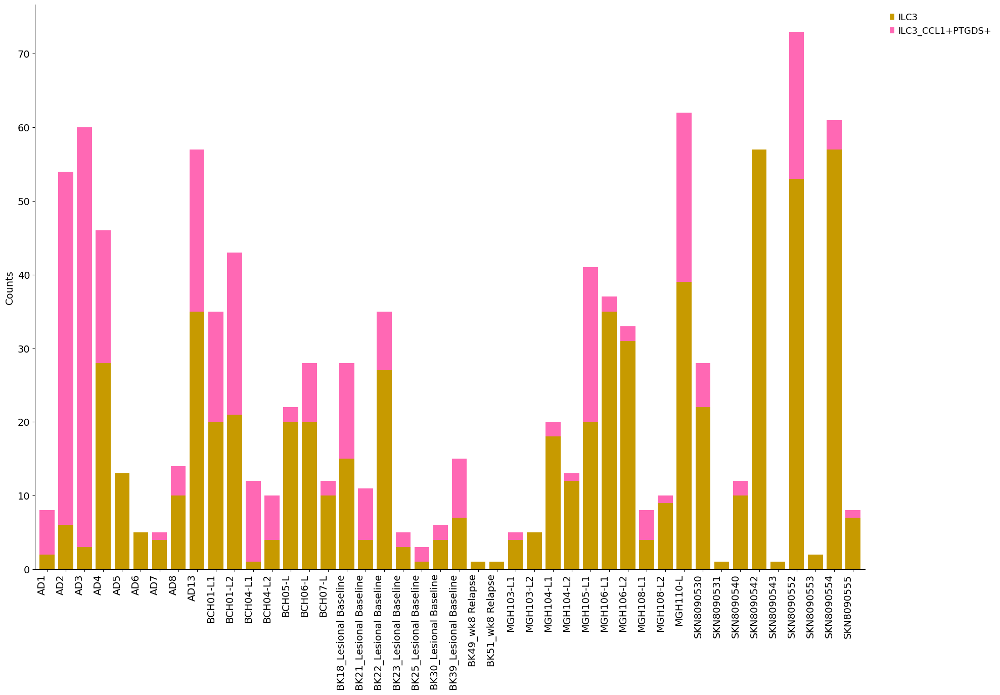

In [39]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter to ILC3 cells
mask = adata.obs["lvl5_annotation"].str.startswith("ILC3")
df = adata.obs.loc[mask, ["sample_id", "lvl5_annotation"]]

# Cross-tab: samples x annotations
ct = pd.crosstab(df["sample_id"], df["lvl5_annotation"])

# Plot
ax = ct.plot.bar(stacked=True, color=[colors.get(c, "#999999") for c in ct.columns],
                 edgecolor="none", width=0.8, figsize=(20, 14))

ax.set_xlabel("")
ax.set_ylabel("Counts")
ax.set_title("")
ax.grid(False)
ax.spines[["top", "right"]].set_visible(False)
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", frameon=False)

plt.xticks(rotation=90, ha="right")
plt.tight_layout()
plt.show()

In [15]:
adata_5k.obs.Site_status.value_counts()

Site_status
Non-lesional                        365837
Validation_dataset                  295228
Lesional                            231621
3D_Week12                           180311
3D_Lesional_baseline                153479
Week 12                             149280
Psoriasis_replicate_PostRx          101005
Psoriasis_replicate_non-lesional     76048
Week 8 Psoriasis                     72094
Psoriasis_replicate_Lesional         60647
Healthy                              59315
Day 14_HF                            30438
Name: count, dtype: int64

In [16]:
[x for x in adata.obs.sample_id.unique() if "-A1" in x]

['Lesional_CE5-SKI-28-FO-1-S22-A1',
 'Lesional_CE6-SKI-28-FO-4-S22-A1',
 'Lesional_CE3-SKI-24-FO-1-S22-A1',
 '3D_BK25_week12-A1',
 '3D_BK22_Lesional_baseline-A1',
 'BK22-SKI-27-FO-2-S7-A1']

In [7]:
# adata.write(PATH+".backup")

In [8]:
adata_5k.obs["Annotation"]=adata_5k.obs["lvl5_annotation"]


In [9]:
adata_5k.obs["Annotation"].value_counts()

Annotation
KC3                 189820
KC1                 126090
F2: Universal       100872
Pericyte1            85232
VE3_Ven              69056
                     ...  
Neutrophil              17
KC_HF: HS               14
ILC_Prolif              12
ILC1_NCR2+P2RX7+         8
Mac_CX3CR1+              8
Name: count, Length: 100, dtype: int64

In [10]:
[x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3_C")]

['ILC3_CCL1+PTGDS+']

# ILC3_CCL1+

In [ ]:
adata

In [18]:
adata.obs["Site_status"].value_counts()

Site_status
Non-lesional                         1509239
Lesional                              568318
Validation_dataset                    295228
Healthy                               202749
3D_Week12                             180311
3D_Lesional_baseline                  153479
Week 12                               149280
Psoriasis_replicate_PostRx            101005
PostRx                                 96485
Psoriasis_replicate_non-lesional       76048
Week 8 Psoriasis                       72094
Psoriasis_replicate_Lesional           60647
Day 14_HF                              30438
PostRx-Lesional Dupilumab (16 wk)       6694
PostRx-Lesional Dupilumab (1 yr)        4226
Name: count, dtype: int64

In [11]:
adata.obs["Site_status_binary"].value_counts()

Site_status_binary
Non-lesional                         1143402
Lesional                              336697
Healthy                               143434
PostRx                                 96485
PostRx-Lesional Dupilumab (16 wk)       6694
PostRx-Lesional Dupilumab (1 yr)        4226
Name: count, dtype: int64

In [26]:
adata_5k=adata[adata.obs["Site_status"].str.startswith("3D")]

0 True
3D_BK22_Lesional_baseline-A2 - Cell count:  8


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


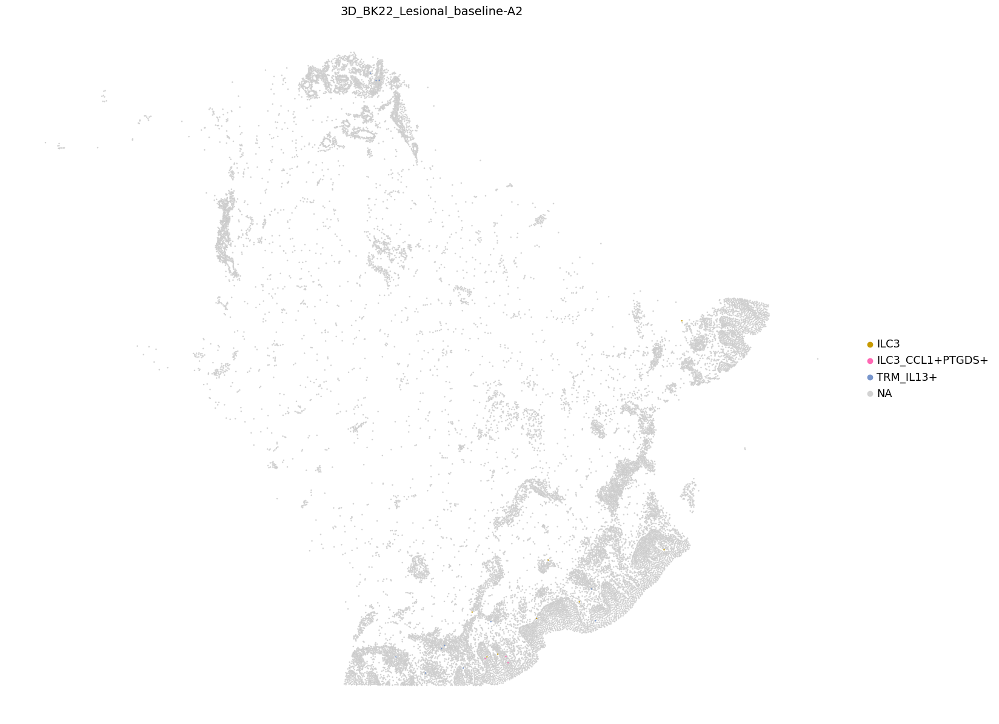

1 True
3D_BK25_week12-D1orE1a - Cell count:  8


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


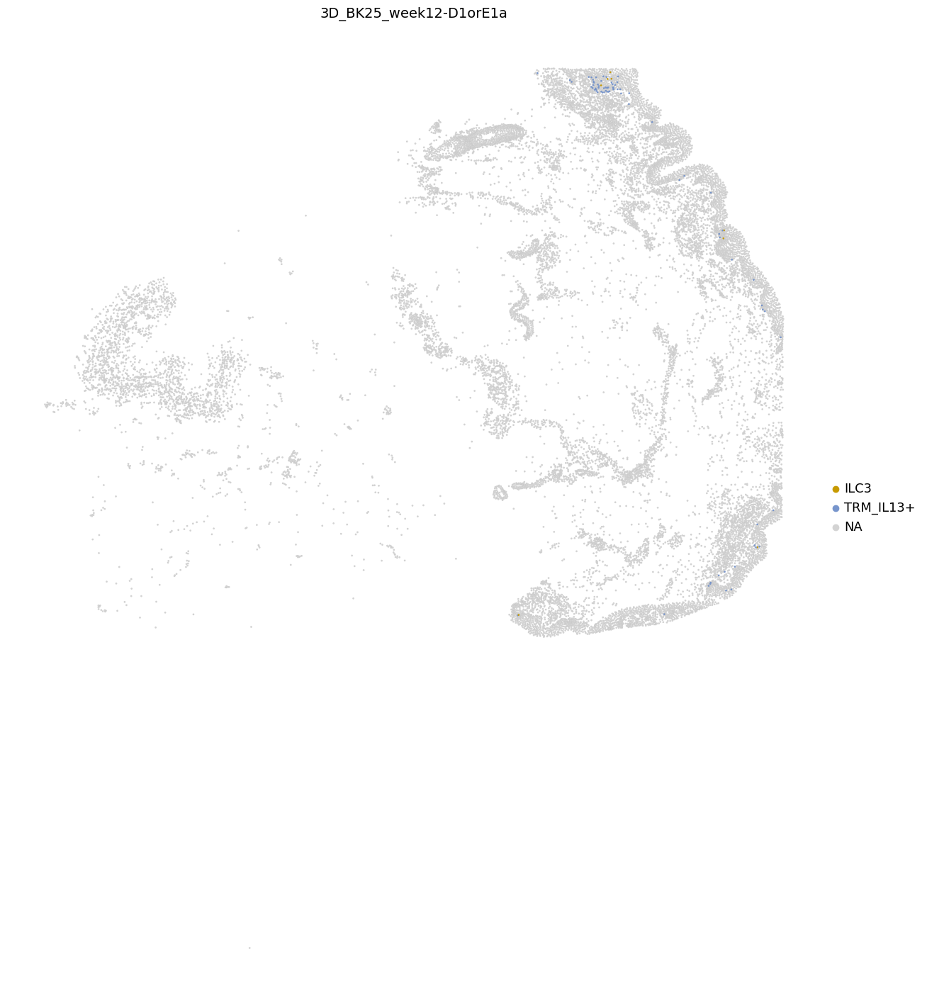

2 True
3D_BK25_week12-A1 - Cell count:  5


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


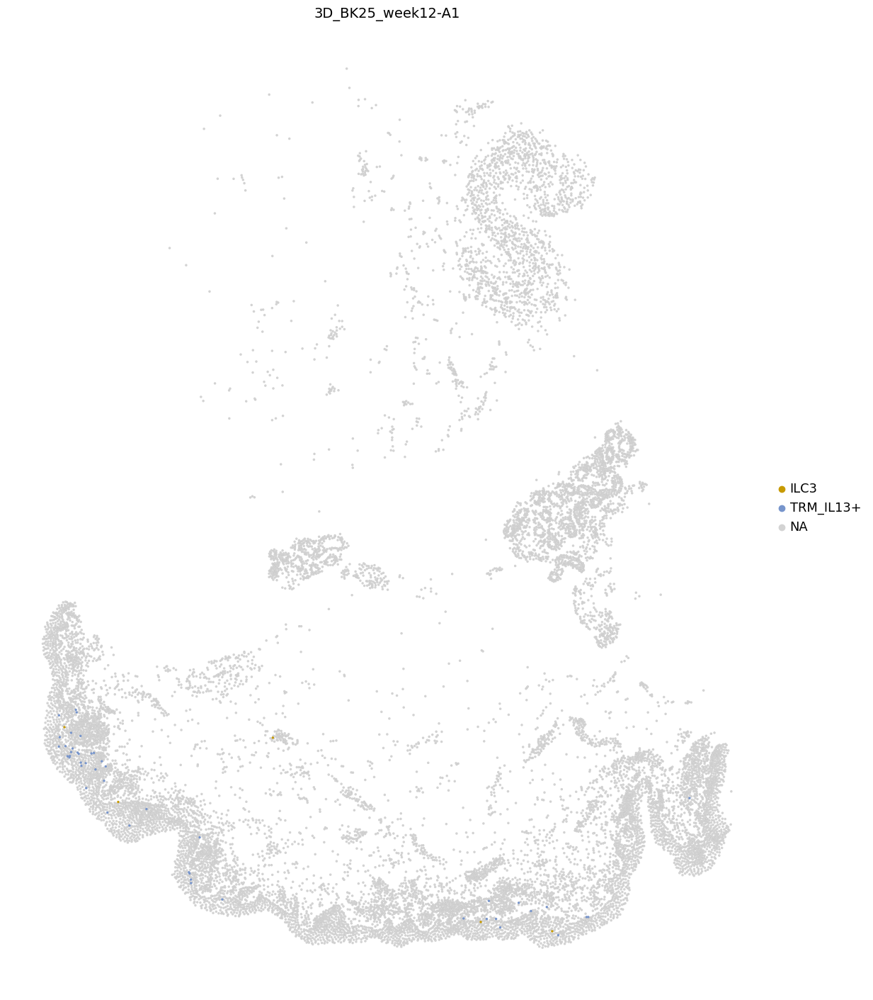

3 True
3D_BK22_Lesional_baseline-D1 - Cell count:  15


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


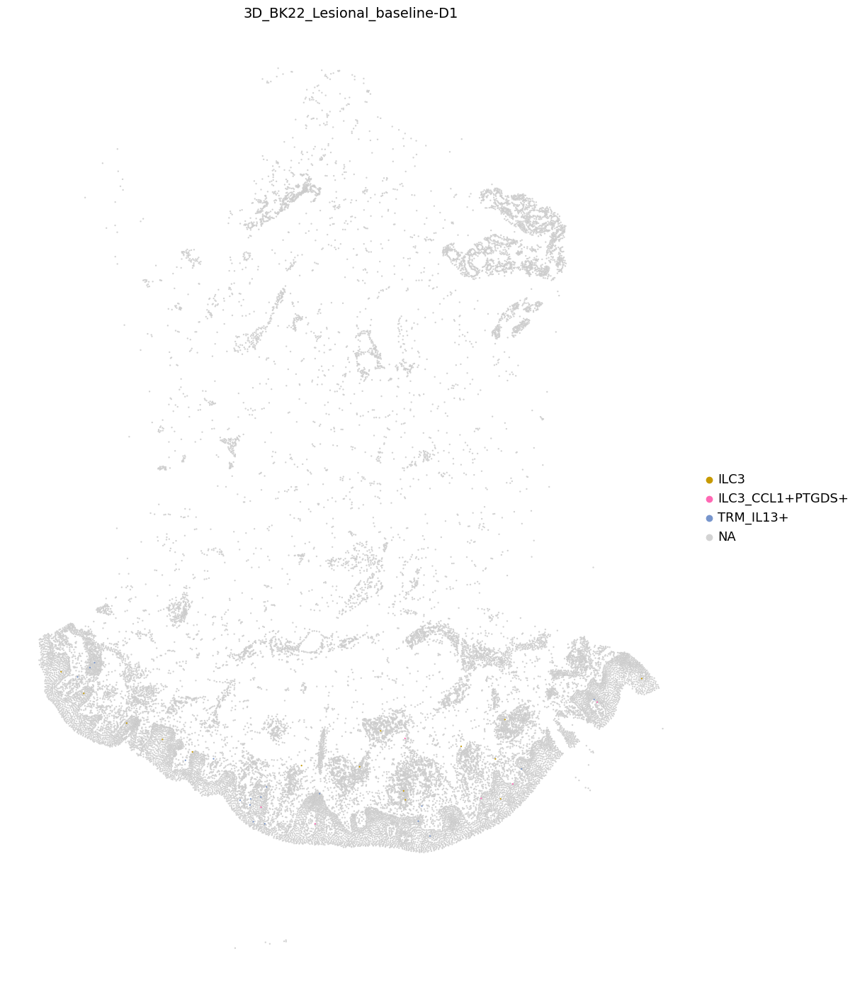

4 True
3D_BK25_week12-D1orE1b - Cell count:  7


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


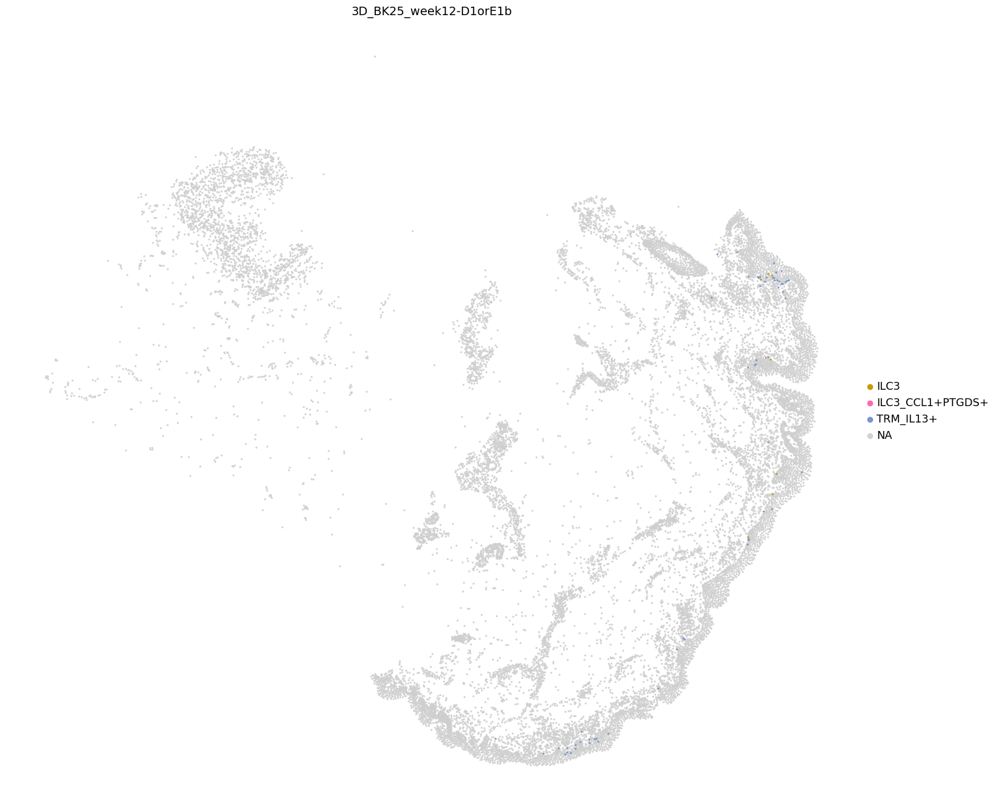

5 True
3D_BK25_week12-B1 - Cell count:  3


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


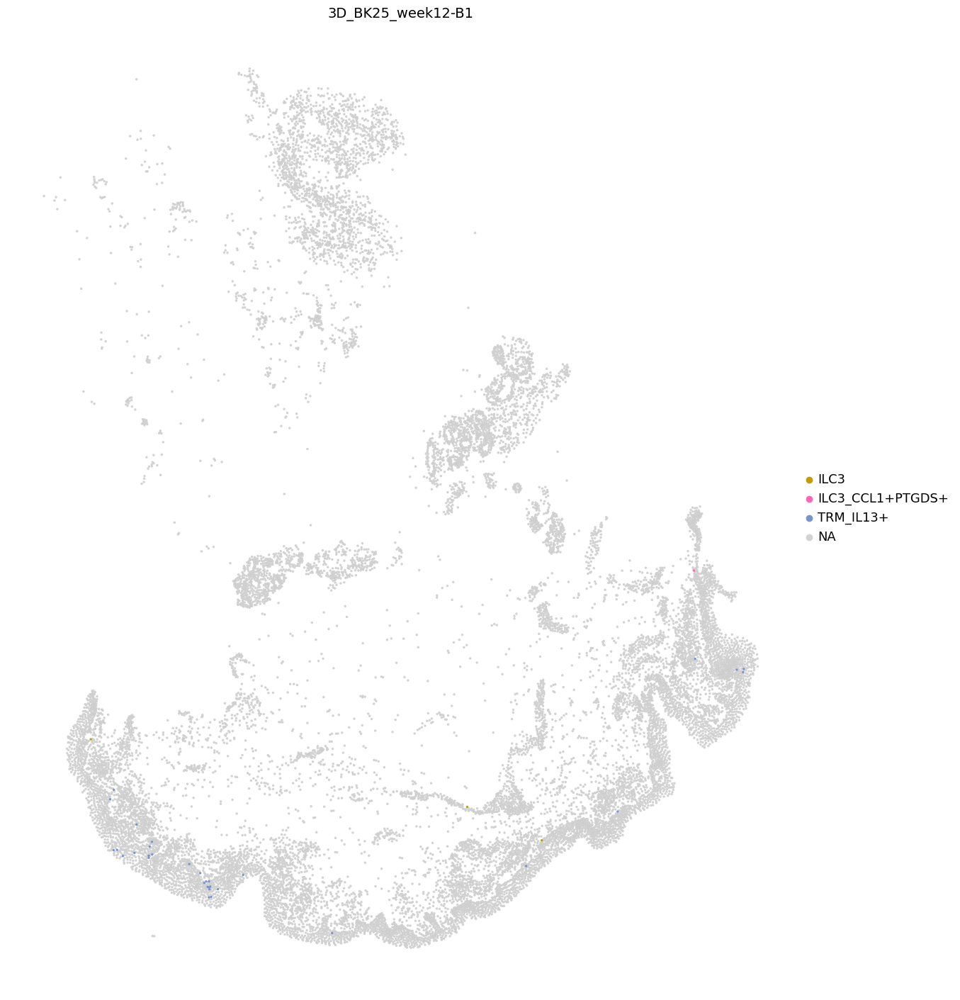

6 True
3D_BK22_Lesional_baseline-B2 - Cell count:  7


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


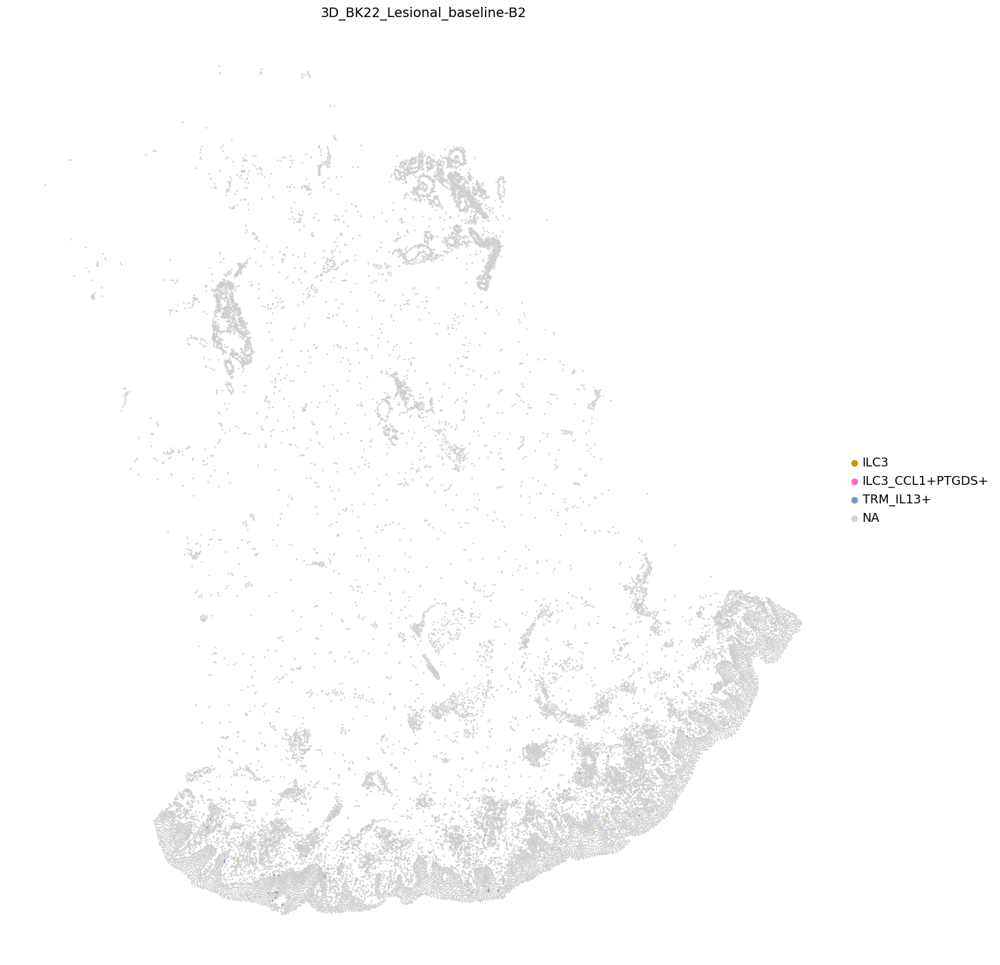

7 True
3D_BK25_week12-C1 - Cell count:  2


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


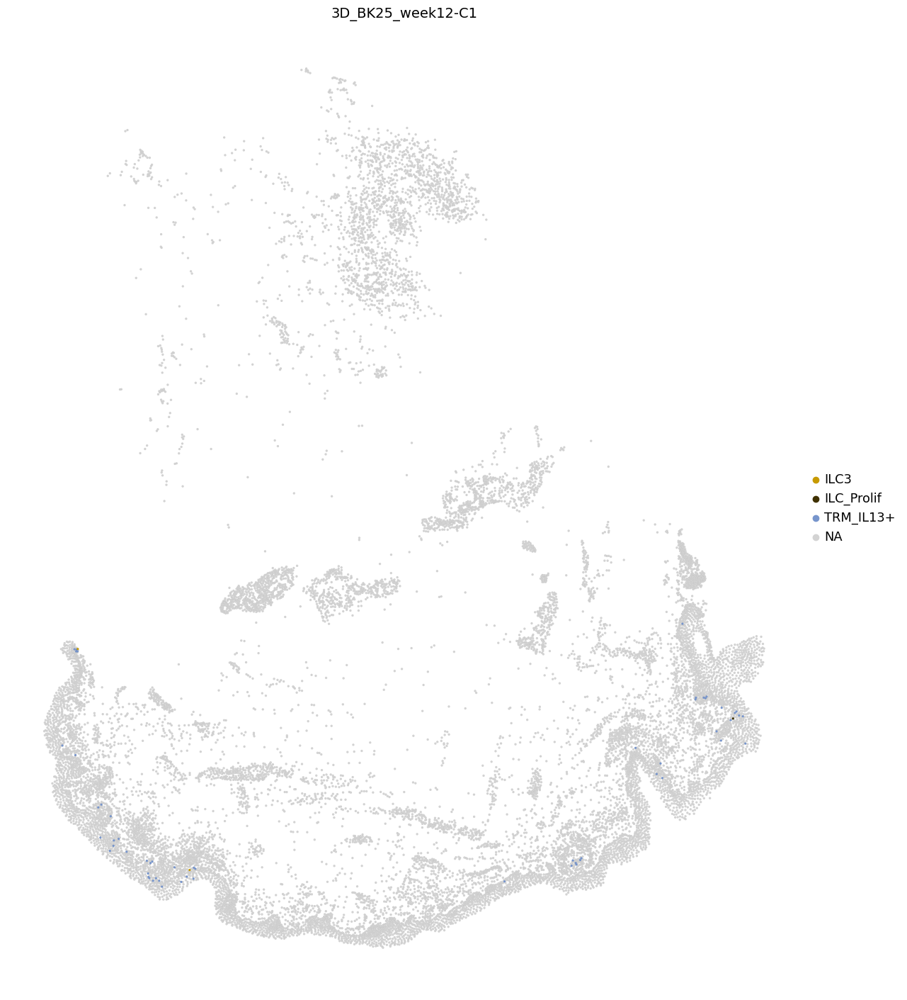

8 True
3D_BK25_week12-D2 - Cell count:  25


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


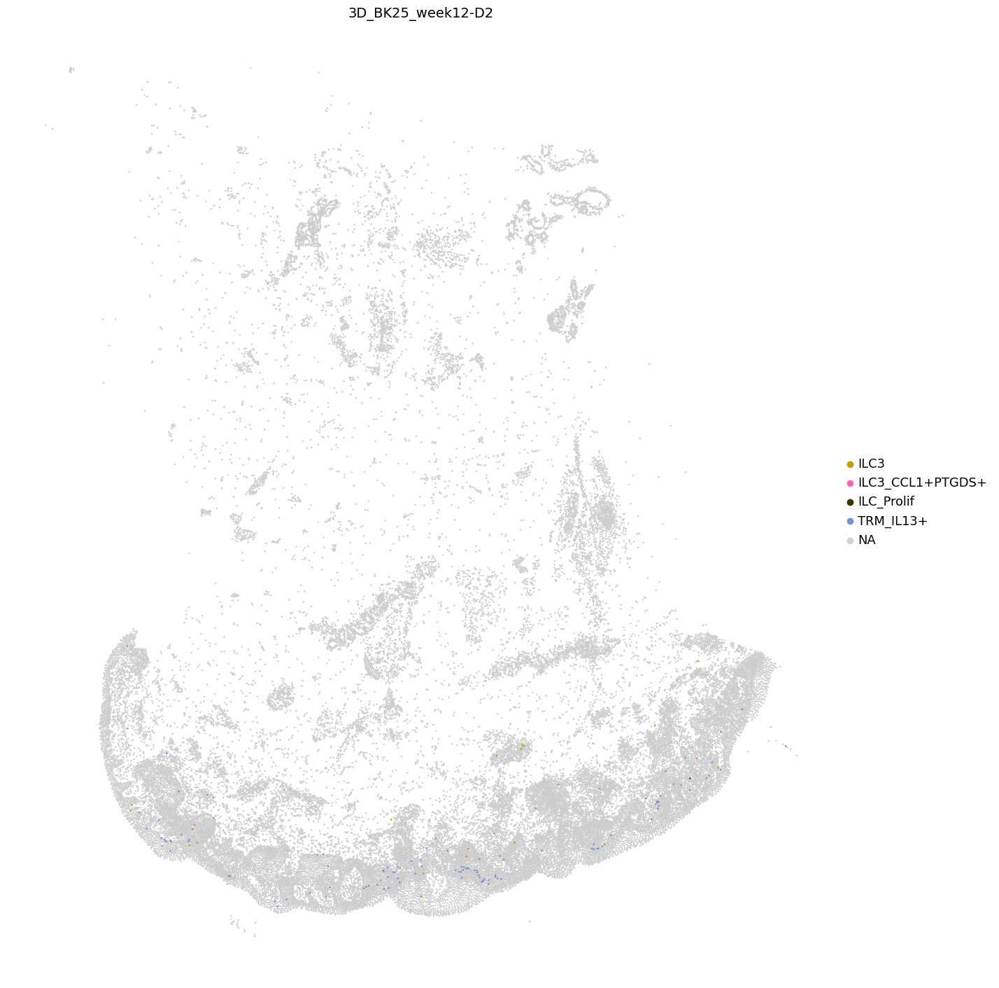

9 True
3D_BK22_Lesional_baseline-D2 - Cell count:  10


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


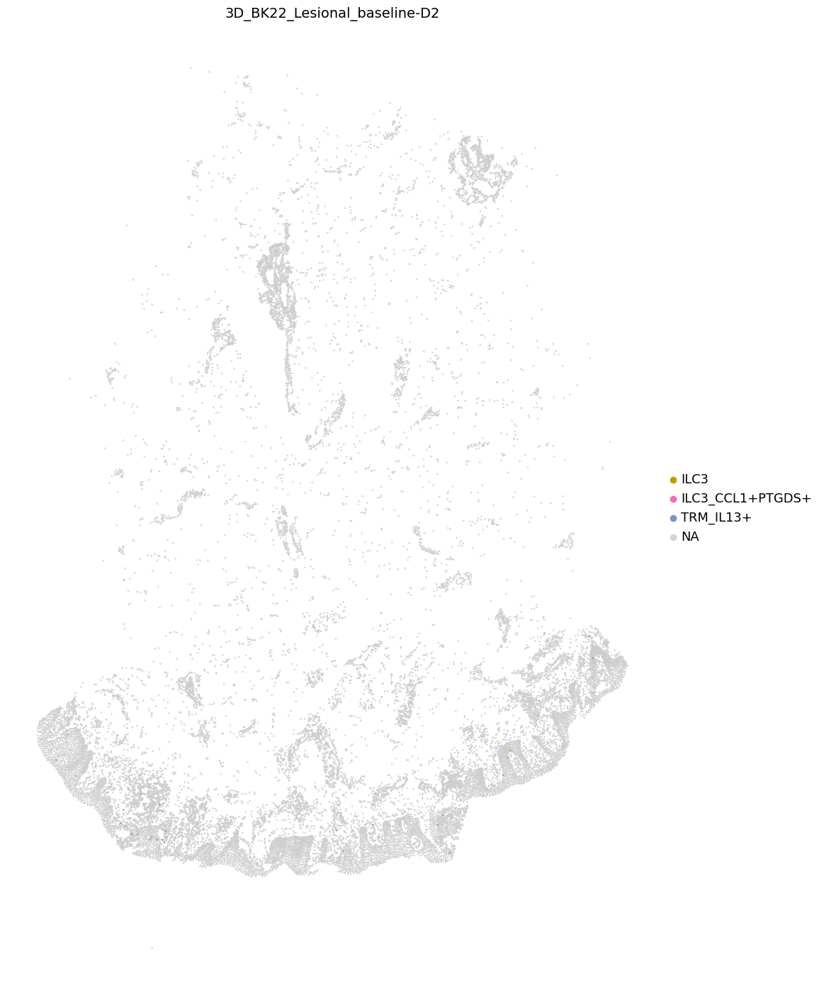

10 True
3D_BK25_week12-B2 - Cell count:  3


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


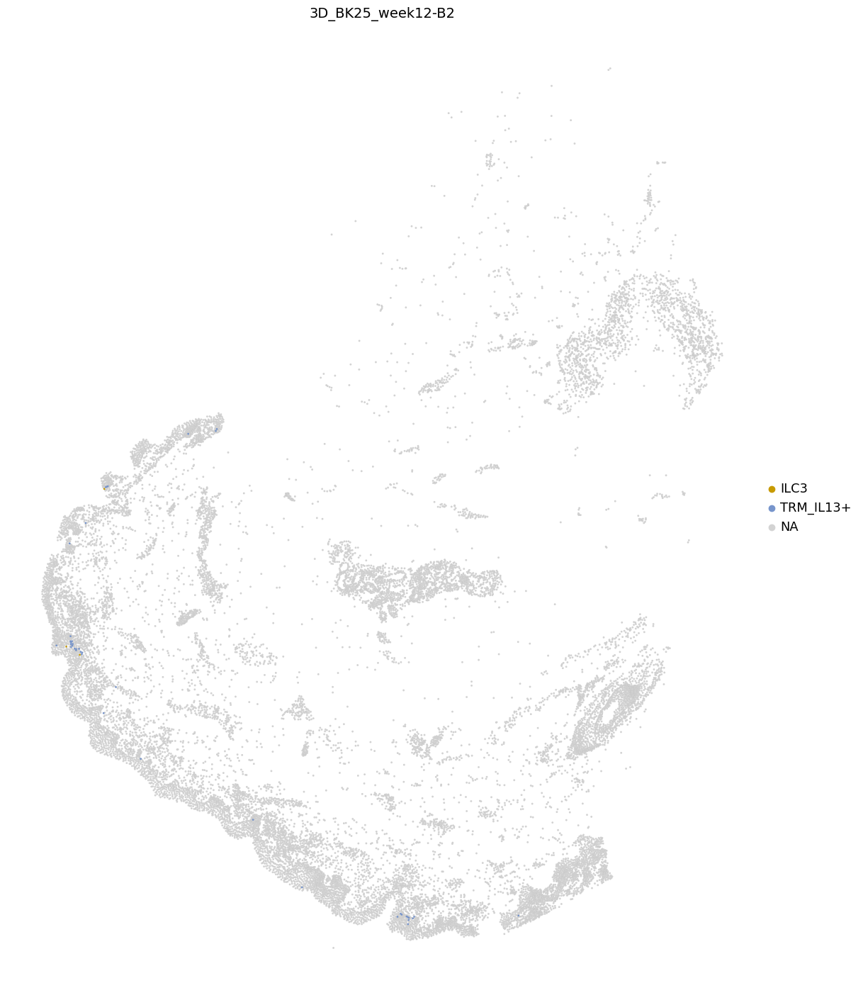

11 True
3D_BK22_Lesional_baseline-A1 - Cell count:  20


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


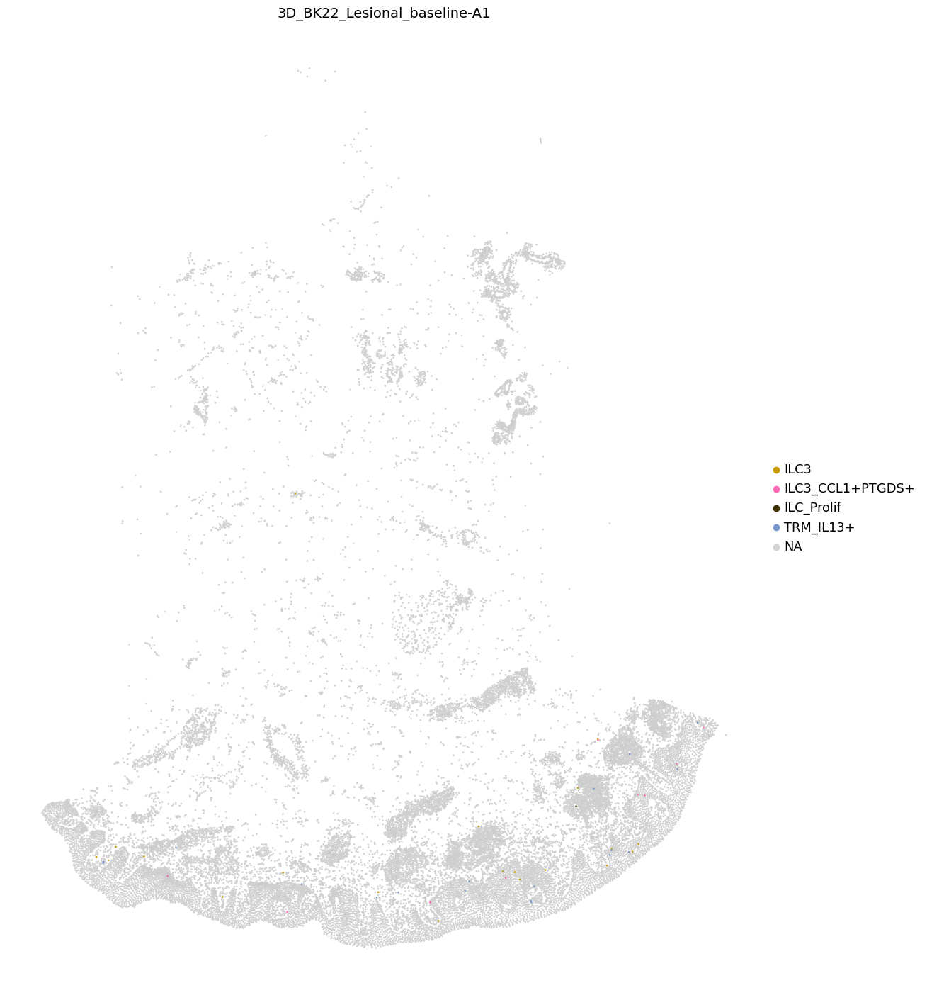

12 True
3D_BK25_week12-C2 - Cell count:  6


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


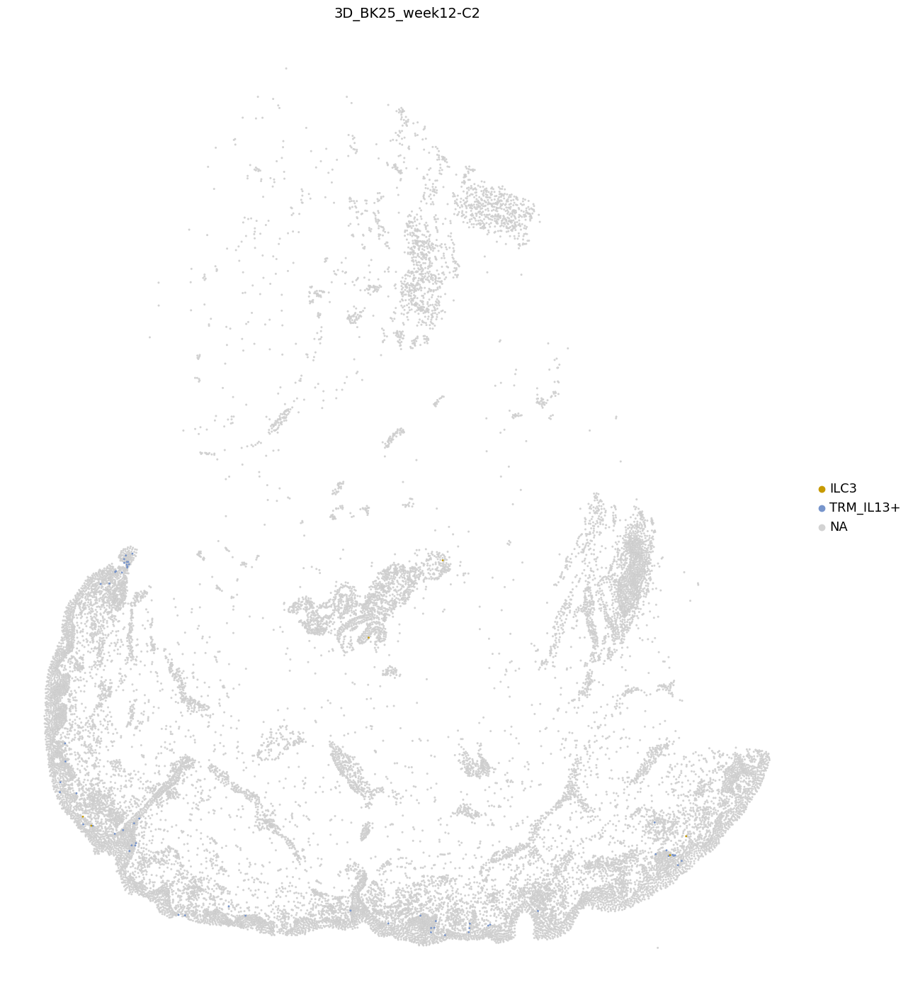

13 True
3D_BK25_week12-A2 - Cell count:  3


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


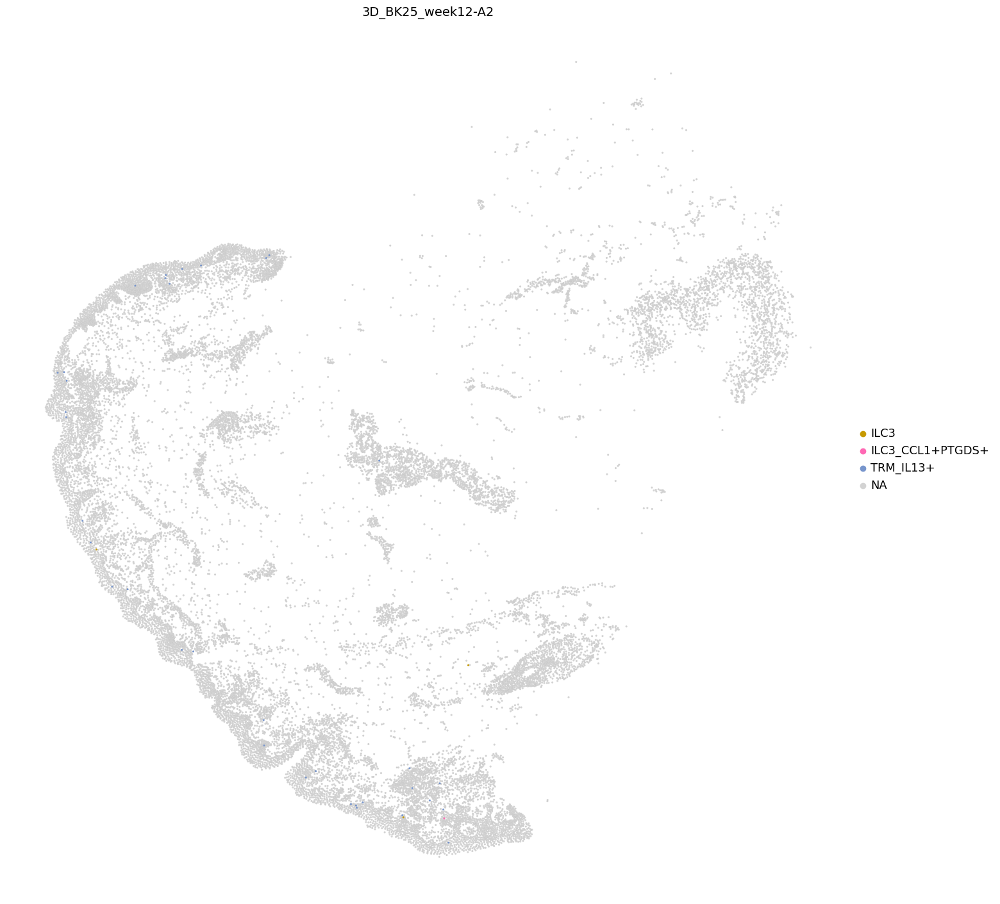

14 True
3D_BK22_Lesional_baseline-B1 - Cell count:  18


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


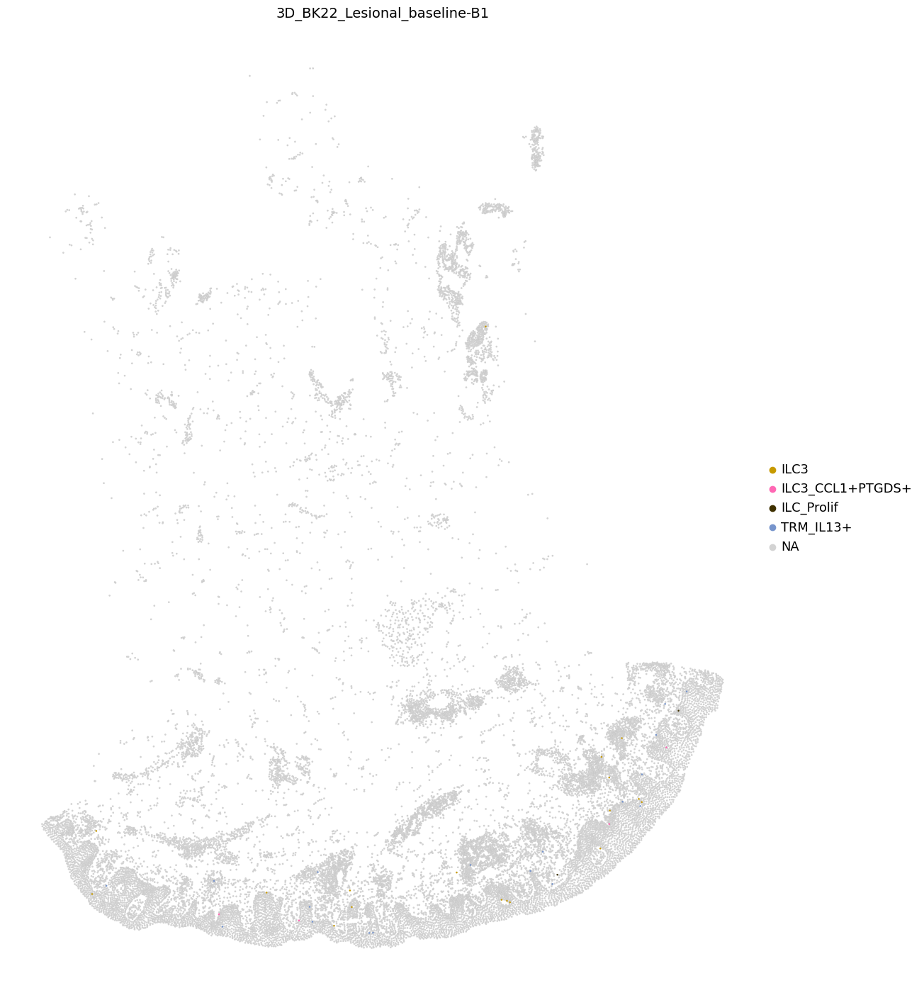

15 True
3D_BK22_Lesional_baseline-C2 - Cell count:  10


/tmp/ipykernel_1050695/1411772491.py:48: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_1050695/1411772491.py:54: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


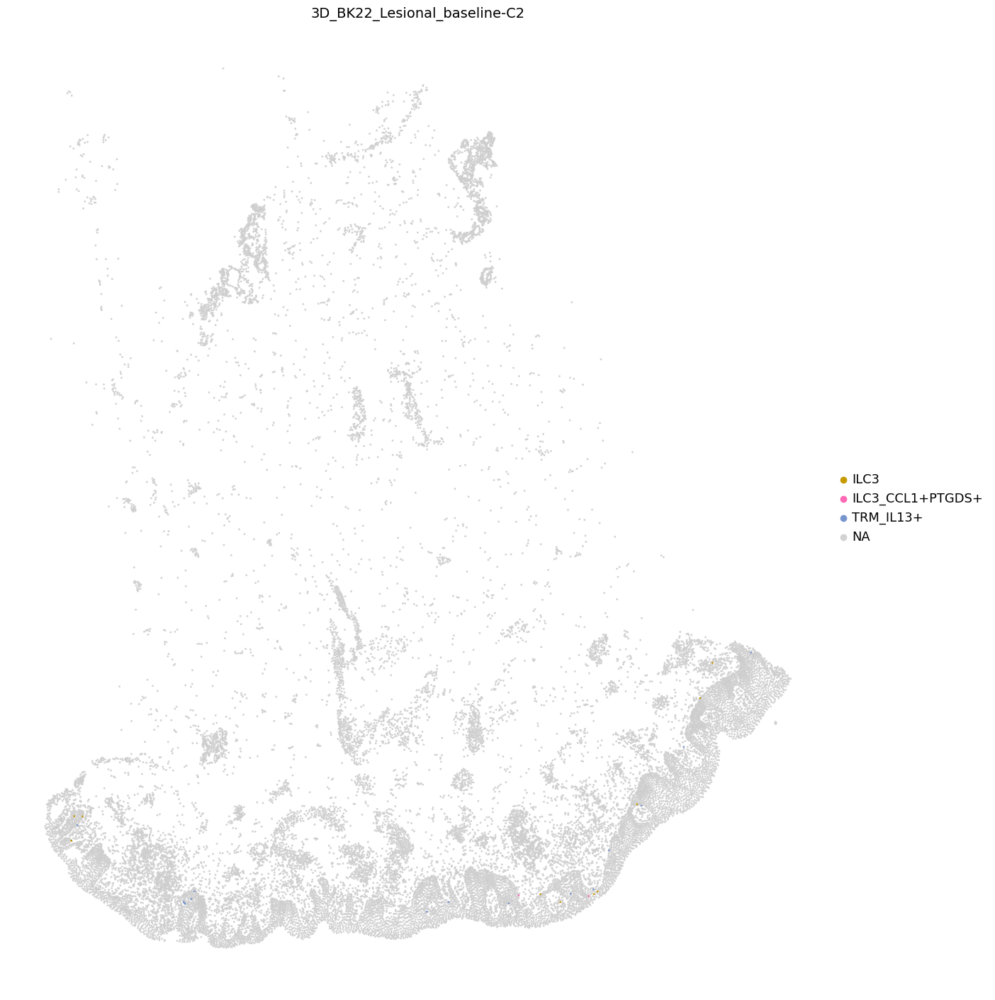

In [27]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3")][0]
MIN_CELL_COUNT=0


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs.info_id6.unique():
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["lvl5_annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["lvl5_annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="lvl5_annotation",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    #palette=custom_palette,
              #  palette=colors,
                groups=["ILC3", "ILC3_CCL1+PTGDS+", "ILC_Prolif", "TRM_IL13+",# "TRM_IL17+"
                       ],
                    edgecolor='black',
                    linewidth=0.01,
                #save=f"ILC3_location_{tissue_section_id}.pdf"

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3")][0]
MIN_CELL_COUNT=0


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in ['3D_BK22_Lesional_baseline-A1',
 'BK18_Lesional Baseline',
 'BK39_Week 12',]:
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["lvl5_annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["lvl5_annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="lvl5_annotation",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    #palette=custom_palette,
              #  palette=colors,
                groups=["ILC3", "ILC3_CCL1+PTGDS+", "ILC_Prolif", "TRM_IL13+",# "TRM_IL17+"
                       ],
                    edgecolor='black',
                    linewidth=0.01,
                €save=f"ILC3_location_{tissue_section_id}.pdf"

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [11]:
adata_5k[adata_5k.obs["lvl5_annotation"].str.startswith("ILC3_C")].obs.lvl5_annotation.value_counts()

lvl5_annotation
ILC3_CCL1+PTGDS+    150
Name: count, dtype: int64

In [12]:
adata_5k[adata_5k.obs["lvl5_annotation"].str.startswith("ILC3_C")].obs.info_id6.value_counts()

info_id6
BK39_Week 12                              17
BK18_Lesional Baseline                    13
BK25_Week 12                              10
3D_BK22_Lesional_baseline-A1               9
BK22_Lesional Baseline                     8
BK30_Day 14                                8
BK39_Lesional Baseline                     8
BK21_Lesional Baseline                     7
3D_BK22_Lesional_baseline-D1               6
BK27_Week 12                               6
Lesional_CE3-SKI-24-FO-1-S22-A1            5
BK43_Never Lesional                        4
3D_BK22_Lesional_baseline-B1               4
3D_BK25_week12-D2                          4
BK23_Week 12                               4
BK30_Non-lesional Baseline                 4
3D_BK22_Lesional_baseline-A2               3
BK22_Non-lesional Baseline                 3
3D_BK22_Lesional_baseline-D2               3
3D_BK22_Lesional_baseline-C2               2
3D_BK22_Lesional_baseline-B2               2
BK30_Lesional Baseline                     2
B

In [13]:
adata_i=adata_5k[adata_5k.obs["info_id6"]=="BK39_Lesional Baseline"]
adata_i.shape

adata_i.obs["group"]=adata_i.obs["Annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk39_anno_core.csv", index=False)
df.head(5)

/tmp/ipykernel_470432/1226579930.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["group"]=adata_i.obs["Annotation"]


,cell_id,group
aaacghfc-1_output-XETG00155__0043607__BK39-SKI-27-FO-1-S3__20241010__133127,aaacghfc-1,KC1
aaadpdim-1_output-XETG00155__0043607__BK39-SKI-27-FO-1-S3__20241010__133127,aaadpdim-1,KC1
aaafdgfc-1_output-XETG00155__0043607__BK39-SKI-27-FO-1-S3__20241010__133127,aaafdgfc-1,KC1-2_cycling
aaagelgk-1_output-XETG00155__0043607__BK39-SKI-27-FO-1-S3__20241010__133127,aaagelgk-1,KC1
aabacaoi-1_output-XETG00155__0043607__BK39-SKI-27-FO-1-S3__20241010__133127,aabacaoi-1,Treg


In [28]:
[x for x in adata_5k.obs["info_id6"].unique() if "B2" in x]

['3D_BK22_Lesional_baseline-B2', '3D_BK25_week12-B2']

In [29]:
adata_i=adata_5k[adata_5k.obs["info_id6"]== '3D_BK22_Lesional_baseline-B2']
adata_i.shape

adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk22_b2_anno_3d.csv", index=False)
df.head(5)

/tmp/ipykernel_1050695/631808359.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]


,cell_id,group
aaaabmhb-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S46-B2__20250710__124204,aaaabmhb-1,Mac2
aaacgodj-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S46-B2__20250710__124204,aaacgodj-1,KC1
aaachlho-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S46-B2__20250710__124204,aaachlho-1,KC1-2_cycling
aaafodjo-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S46-B2__20250710__124204,aaafodjo-1,KC3
aaagejle-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S46-B2__20250710__124204,aaagejle-1,KC3


In [30]:
[x for x in adata_5k.obs["info_id6"].unique() if "C2" in x]

['3D_BK25_week12-C2', '3D_BK22_Lesional_baseline-C2']

In [31]:
adata_i=adata_5k[adata_5k.obs["info_id6"]== '3D_BK25_week12-C2']
adata_i.shape

adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk25_C2_anno_3d.csv", index=False)
df.head(5)

/tmp/ipykernel_1050695/3146192612.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]


,cell_id,group
aaabdimi-1_output-XETG00055__0056865__BK25-SKI-27-FO-5-S46-C2__20250710__124204,aaabdimi-1,KC1
aaaddkhg-1_output-XETG00055__0056865__BK25-SKI-27-FO-5-S46-C2__20250710__124204,aaaddkhg-1,KC3
aaagomdl-1_output-XETG00055__0056865__BK25-SKI-27-FO-5-S46-C2__20250710__124204,aaagomdl-1,T
aaaiclpp-1_output-XETG00055__0056865__BK25-SKI-27-FO-5-S46-C2__20250710__124204,aaaiclpp-1,KC1-2_cycling
aaajdoai-1_output-XETG00055__0056865__BK25-SKI-27-FO-5-S46-C2__20250710__124204,aaajdoai-1,KC1


In [24]:
[x for x in adata_5k.obs["info_id6"].unique() if "B1" in x]

['3D_BK22_Lesional_baseline-B1']

In [25]:
adata_i=adata_5k[adata_5k.obs["info_id6"]== '3D_BK22_Lesional_baseline-B1']
adata_i.shape

adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk22_b1_anno_3d.csv", index=False)
df.head(5)

/tmp/ipykernel_1050695/3513093953.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]


,cell_id,group
aaabnhge-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S23-B1__20250710__124204,aaabnhge-1,KC1
aaackdkb-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S23-B1__20250710__124204,aaackdkb-1,KC1-2_cycling
aaaflbjb-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S23-B1__20250710__124204,aaaflbjb-1,KC1
aaageenl-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S23-B1__20250710__124204,aaageenl-1,KC1
aaajnodn-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S23-B1__20250710__124204,aaajnodn-1,KC5


In [17]:
adata_i=adata_5k[adata_5k.obs["info_id6"]=="3D_BK22_Lesional_baseline-A1"]
adata_i.shape

adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk22_A1_anno_3d.csv", index=False)
df.head(5)

/tmp/ipykernel_1050695/239604244.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["group"]=adata_i.obs["lvl5_annotation"]


,cell_id,group
aaaddnfd-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S17-A1__20250710__124204,aaaddnfd-1,KC1
aaadnbfp-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S17-A1__20250710__124204,aaadnbfp-1,LC
aaaibnfl-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S17-A1__20250710__124204,aaaibnfl-1,KC1
aaakbpdp-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S17-A1__20250710__124204,aaakbpdp-1,KC
aaamgdfp-1_output-XETG00055__0056853__BK22-SKI-27-FO-1-S17-A1__20250710__124204,aaamgdfp-1,KC5


In [15]:
#adata_i=adata_5k[adata_5k.obs["info_id6"]=="BK39_Week 12"
adata_i=adata_5k[adata_5k.obs["xenium_id"]=="BK39-SKI-27-FO-4-5-S3"]
adata_i.shape

adata_i.obs["group"]=adata_i.obs["Annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk39_W12_anno_core.csv", index=False)
df.head(5)



/tmp/ipykernel_470432/1853826411.py:5: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["group"]=adata_i.obs["Annotation"]


,cell_id,group
aaabeaej-1_output-XETG00155__0043607__BK39-SKI-27-FO-4-5-S3__20241010__133127,aaabeaej-1,KC3
aaabpcgo-1_output-XETG00155__0043607__BK39-SKI-27-FO-4-5-S3__20241010__133127,aaabpcgo-1,KC3
aaacmodj-1_output-XETG00155__0043607__BK39-SKI-27-FO-4-5-S3__20241010__133127,aaacmodj-1,KC3
aaaebobf-1_output-XETG00155__0043607__BK39-SKI-27-FO-4-5-S3__20241010__133127,aaaebobf-1,KC3
aaahpdhm-1_output-XETG00155__0043607__BK39-SKI-27-FO-4-5-S3__20241010__133127,aaahpdhm-1,KC1


In [16]:
list(adata_i.obs.columns)

['sample_id',
 'barcode',
 'GSE',
 'Site_status',
 'Patient_status',
 'Location',
 'Age',
 'Sex',
 'n_genes',
 'dataset_id',
 'n_genes_by_counts',
 'total_counts',
 'pct_counts_in_top_50_genes',
 'pct_counts_in_top_100_genes',
 'pct_counts_in_top_200_genes',
 'pct_counts_in_top_500_genes',
 'total_counts_mt',
 'pct_counts_mt',
 'total_counts_ribo',
 'pct_counts_ribo',
 'QC_hi',
 'QC_mid',
 'lvl5_annotation',
 'Mapping_status',
 'scanvi_predictions',
 'lvl5_annotation_new',
 'lvl5_annotation_new2',
 'lvl5_annotation_new3',
 'lvl5_annotation_new_archive',
 'lvl5_annotation_new_preoprhan',
 'lvl5_annotation_new10',
 'lvl5_annotation_new11',
 'test',
 'test_n',
 'lvl5_annotation_new12',
 'lvl5_annotation_new13',
 'lvl4_annotation',
 'lvl0',
 'temp',
 't',
 'leiden_res0.1',
 'Site_status_simple',
 'StatusMilo',
 'atlas_status',
 'atlas_status_reynolds',
 'atlas_status_reynolds_simple',
 'atlas_status_simple',
 'atlas_status_simple2',
 'Site_status_binary',
 'scanvi_labels',
 'cell_id',
 'x_

In [17]:
# adata_i.obs.xenium_id.value_counts()

In [18]:
# #adata_i.obs

# 'output-XETG00155__0043607__BK39-SKI-27-FO-2-S3-4__20241010__133127'

In [19]:
adata_i.obs.sample_id.value_counts()

sample_id
BK39_Week 12    32054
Name: count, dtype: int64

In [20]:
sorted(list(adata_5k.obs["info_id6"].unique()))

['3D_BK22_Lesional_baseline-A1',
 '3D_BK22_Lesional_baseline-A2',
 '3D_BK22_Lesional_baseline-B1',
 '3D_BK22_Lesional_baseline-B2',
 '3D_BK22_Lesional_baseline-C2',
 '3D_BK22_Lesional_baseline-D1',
 '3D_BK22_Lesional_baseline-D2',
 '3D_BK25_week12-A1',
 '3D_BK25_week12-A2',
 '3D_BK25_week12-B1',
 '3D_BK25_week12-B2',
 '3D_BK25_week12-C1',
 '3D_BK25_week12-C2',
 '3D_BK25_week12-D1orE1a',
 '3D_BK25_week12-D1orE1b',
 '3D_BK25_week12-D2',
 'BK18_Lesional Baseline',
 'BK18_Non-lesional Baseline',
 'BK18_Week 12',
 'BK20_Lesional Baseline',
 'BK20_Non-lesional Baseline',
 'BK20_Week 12',
 'BK21_Lesional Baseline',
 'BK21_Non-lesional Baseline',
 'BK21_Week 12',
 'BK22_Lesional Baseline',
 'BK22_Non-lesional Baseline',
 'BK23_Lesional Baseline',
 'BK23_Non-lesional Baseline',
 'BK23_Week 12',
 'BK24_Lesional Baseline',
 'BK24_Non-lesional Baseline',
 'BK24_Week 12',
 'BK25_Lesional Baseline',
 'BK25_Non-lesional Baseline',
 'BK25_Week 12',
 'BK27_Lesional Baseline',
 'BK27_Non-lesional Baseli

In [21]:
import pickle
file_path = '/nfs/team298/ls34/color_for_adult_skin2.pkl'

with open(file_path, 'rb') as file:
    colors = pickle.load(file)

In [22]:
# import pickle

# inpath ="/nfs/team298/ls34/dicts/skin_labels14.pkl"
# # "/nfs/team298/ls34/skin_final10.pkl"

# with open(inpath, "rb") as f:
#     md = pickle.load(f)
# adata_5k.obs["tmp"] = adata_5k.obs_names.map(md)
# adata_5k.obs["lvl5_annotation"]=adata_5k.obs["tmp"].fillna(adata_5k.obs["lvl5_annotation"])
# #adata.obs["tmp"].value_counts()

0 True
3D_BK22_Lesional_baseline-A1 - Cell count:  9


/tmp/ipykernel_470432/1818338665.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_470432/1818338665.py:56: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


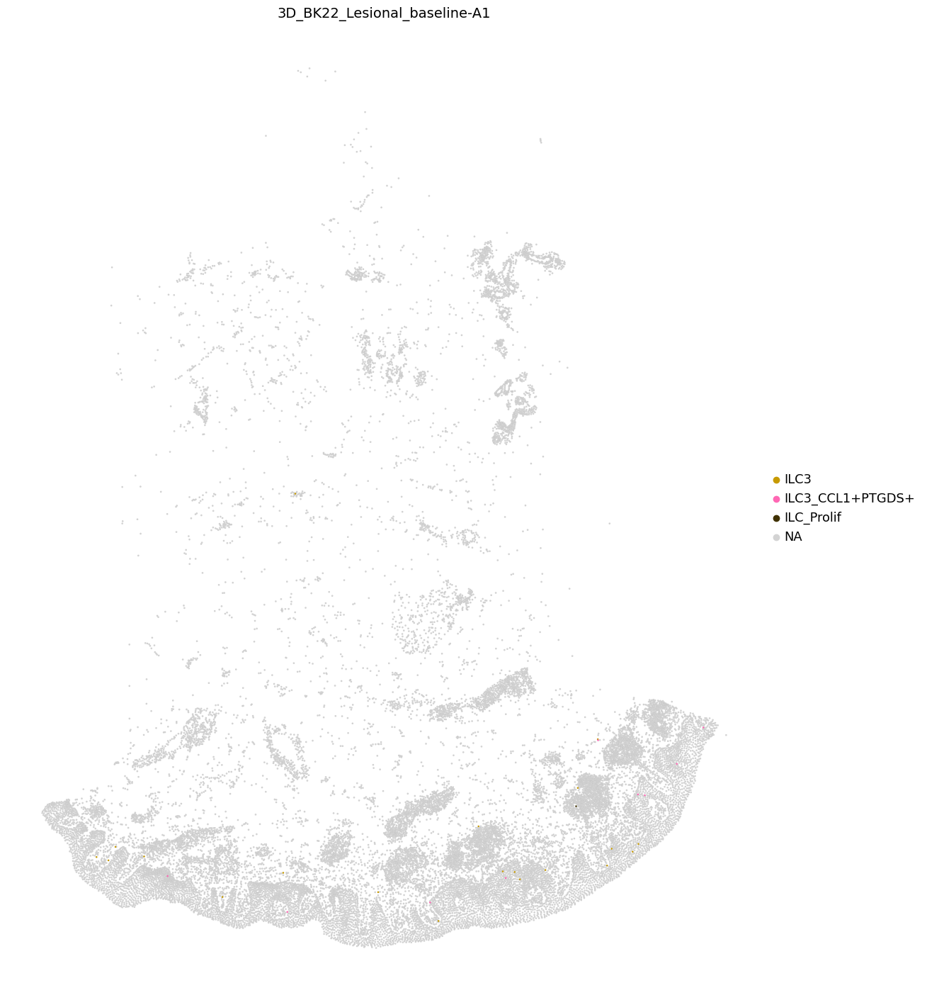

1 True
BK18_Lesional Baseline - Cell count:  13


/tmp/ipykernel_470432/1818338665.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_470432/1818338665.py:56: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


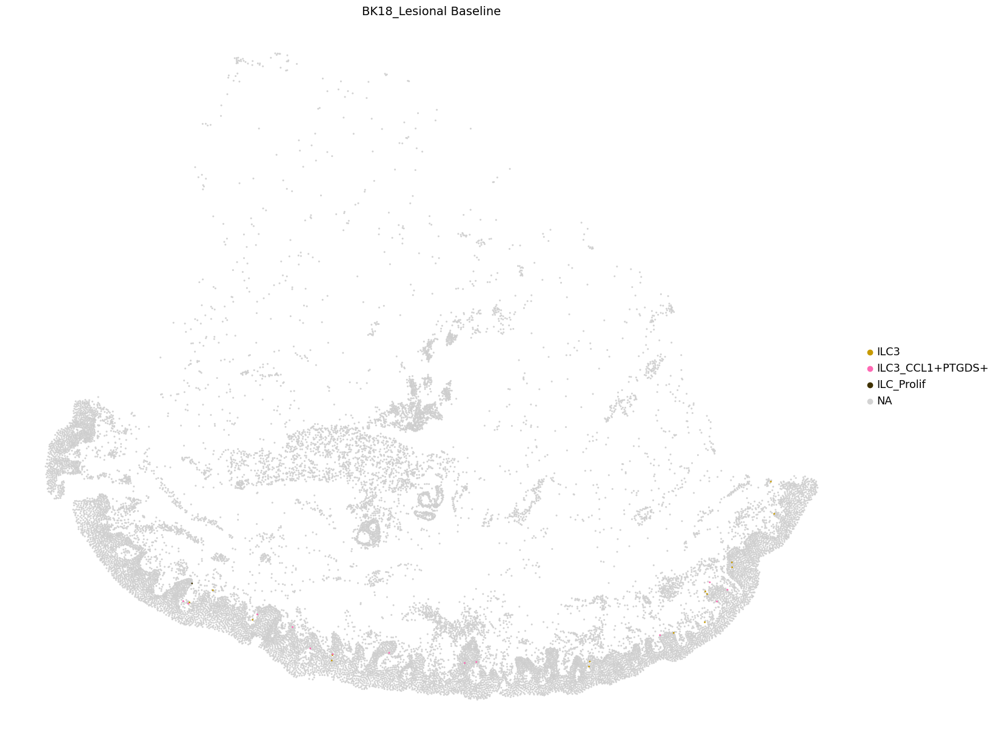

2 True
BK39_Week 12 - Cell count:  17


/tmp/ipykernel_470432/1818338665.py:50: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
/tmp/ipykernel_470432/1818338665.py:56: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


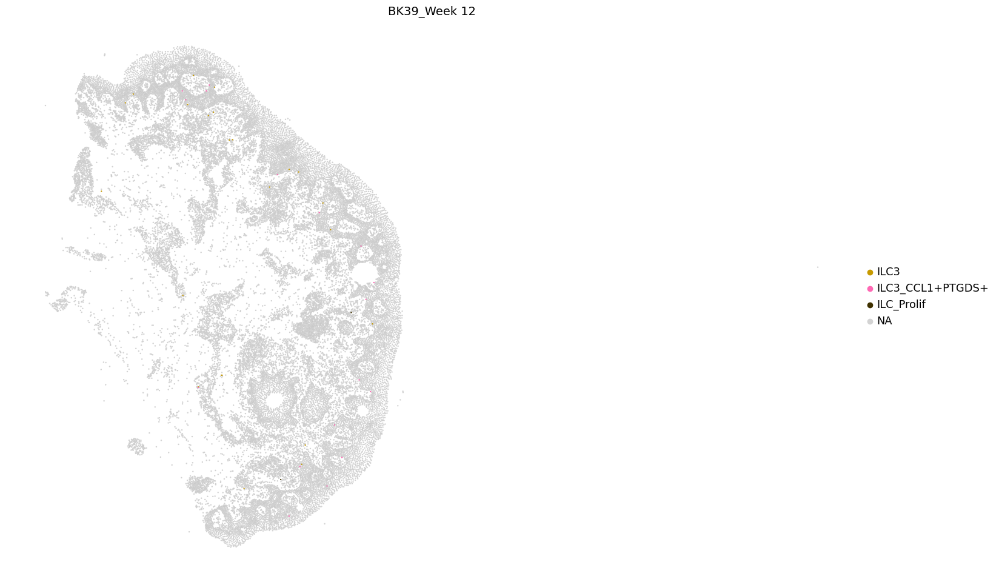

In [23]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3_C")][0]
MIN_CELL_COUNT=0


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in ['3D_BK22_Lesional_baseline-A1',
 'BK18_Lesional Baseline',
 'BK39_Week 12',]:
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["lvl5_annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["lvl5_annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="lvl5_annotation",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    #palette=custom_palette,
              #  palette=colors,
                groups=["ILC3", "ILC3_CCL1+PTGDS+", "ILC_Prolif", #"TRM_IL13+", "TRM_IL17+"
                       ],
                    edgecolor='black',
                    linewidth=0.01,
                save=f"ILC3_location_{tissue_section_id}.pdf"

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [24]:
9

9

In [25]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

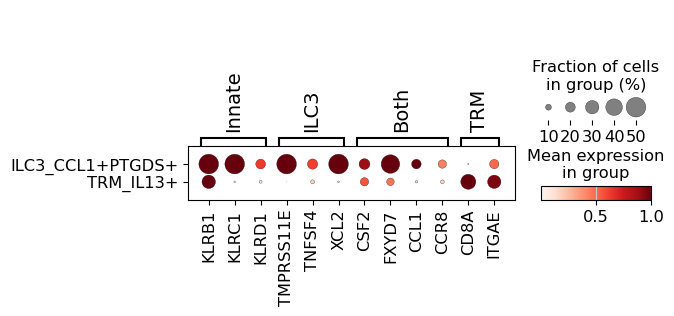

In [34]:
genes = {"Innate":[
    "KLRB1",
    "KLRC1",
    "KLRD1"],
         "ILC3":[
    "TMPRSS11E",
  
    "TNFSF4",
    "XCL2",],
         "Both":[      "CSF2",
    "FXYD7",
    "CCL1","CCR8"],"TRM":[
    "CD8A",
    "ITGAE"]
        }

sc.pl.dotplot(adata[adata.obs["lvl5_annotation"].isin(["ILC3_CCL1+PTGDS+", "TRM_IL13+"])], 
              genes,
              groupby="lvl5_annotation",
              dendrogram=False, 
               # standard_scale="var",
             dot_max=0.5, 
              vmax=1,
              save="ILC_dotplot.pdf"
             )


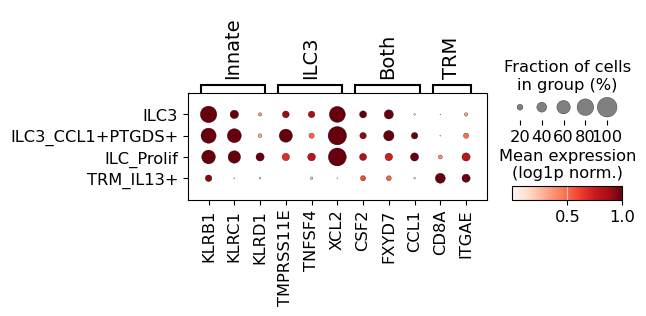

In [27]:
genes = {"Innate":[
    "KLRB1",
    "KLRC1",
    "KLRD1"],
         "ILC3":[
    "TMPRSS11E",
  
    "TNFSF4",
    "XCL2",],
         "Both":[      "CSF2",
    "FXYD7",
    "CCL1",],"TRM":[
    "CD8A",
    "ITGAE"]
        }

adata2=adata[adata.obs.Patient_status=="AD"]
sc.pl.dotplot(adata2[adata2.obs["lvl5_annotation"].isin(["ILC3_CCL1+PTGDS+","ILC3", "ILC_Prolif" ,"TRM_IL13+",])], 
              genes,
              groupby="lvl5_annotation",
              dendrogram=False, 
               # standard_scale="var",
             #dot_max=0.5, 
              categories_order=["ILC3", "ILC3_CCL1+PTGDS+","ILC_Prolif" ,"TRM_IL13+",],
              vmax=1,
              save="ILC_dotplot_SCRNA.pdf",
                            colorbar_title="Mean expression\n(log1p norm.)",

             )


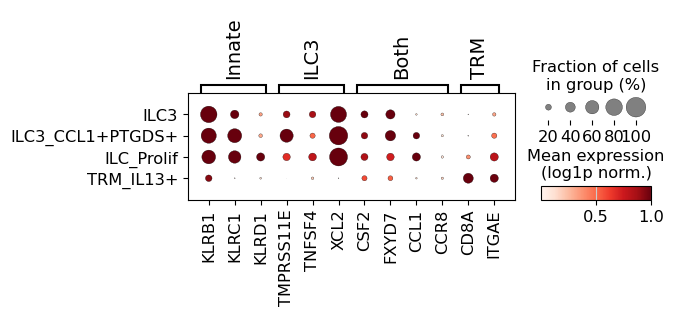

In [28]:
genes = {"Innate":[
    "KLRB1",
    "KLRC1",
    "KLRD1"],
         "ILC3":[
    "TMPRSS11E",
  
    "TNFSF4",
    "XCL2",],
         "Both":[      "CSF2",
    "FXYD7",
    "CCL1", "CCR8"],"TRM":[
    "CD8A",
    "ITGAE"]
        }

adata2=adata[adata.obs.Patient_status=="AD"]
sc.pl.dotplot(adata2[adata2.obs["lvl5_annotation"].isin(["ILC3_CCL1+PTGDS+","ILC3", "ILC_Prolif" ,"TRM_IL13+",])], 
              genes,
              groupby="lvl5_annotation",
              dendrogram=False, 
               # standard_scale="var",
             #dot_max=0.5, 
              categories_order=["ILC3", "ILC3_CCL1+PTGDS+","ILC_Prolif" ,"TRM_IL13+",],
              vmax=1,
              save="ILC_dotplot_SCRNA_ccr8.pdf",
                            colorbar_title="Mean expression\n(log1p norm.)",

             )


In [29]:
adata_5k.obs.tech.value_counts()

tech
xenium    1418806
Name: count, dtype: int64

In [30]:
adata_5k.obs.Patient_status.value_counts()

Patient_status
AD                      627676
Psoriasis               211945
3d_Lesional_baseline    175557
3d_Week12               158233
Healthy                  59315
Name: count, dtype: int64

In [31]:
sc.pp.normalize_total(adata_5k, target_sum=1e4)
sc.pp.log1p(adata_5k)

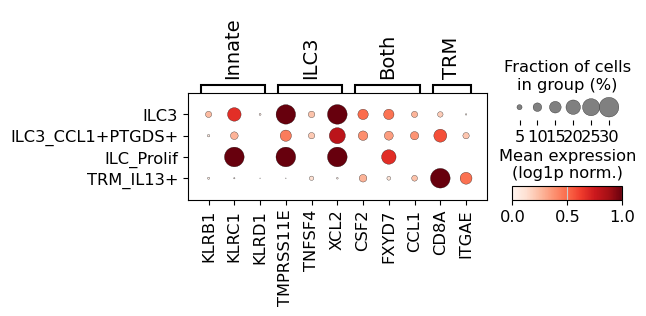

In [32]:
genes = {"Innate":[
    "KLRB1",
    "KLRC1",
    "KLRD1"],
         "ILC3":[
    "TMPRSS11E",
  
    "TNFSF4",
    "XCL2",],
         "Both":[      "CSF2",
    "FXYD7",
    "CCL1",],"TRM":[
    "CD8A",
    "ITGAE"]
        }

adata2=adata_5k[adata_5k.obs.Patient_status=="AD"]
sc.pl.dotplot(adata2[adata2.obs["lvl5_annotation"].isin(["ILC3_CCL1+PTGDS+","ILC3", "ILC_Prolif" ,"TRM_IL13+",])], 
              genes,
              groupby="lvl5_annotation",
              dendrogram=False, 
               # standard_scale="var",
             dot_max=0.3, 
              categories_order=["ILC3", "ILC3_CCL1+PTGDS+","ILC_Prolif" ,"TRM_IL13+",],
              vmax=1,
              colorbar_title="Mean expression\n(log1p norm.)",
              save="ILC_dotplot_xenium.pdf"
             )


In [33]:
s

NameError: name 's' is not defined

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3_C")][0]
MIN_CELL_COUNT=0


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in ['3D_BK22_Lesional_baseline-A1',
 'BK18_Lesional Baseline',
 'BK39_Week 12',]:
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["lvl5_annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["lvl5_annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.settings.set_figure_params(dpi=50,
                                          dpi_save=300,
                                          facecolor="white", frameon=False, figsize=(18,18))
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="lvl5_annotation",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    #palette=custom_palette,
                palette=colors,
                groups=["ILC3", "ILC3_CCL1+PTGDS+", "ILC_Prolif"],
                    edgecolor='black',
                    linewidth=0.01,
                save=f"ILC3_location_{tissue_section_id}.pdf"

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [ ]:
1

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3_C")][0]
MIN_CELL_COUNT=5


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs["info_id6"].unique():
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["Annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    palette=custom_palette,
                    edgecolor='black',
                    linewidth=0.01,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [ ]:
# #['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
# CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3_C")][0]
# MIN_CELL_COUNT=5


# i=0
# #adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
# for tissue_section_id in adata_5k.obs["info_id6"].unique():
#     adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
#     niche_names_found = adata_i.obs["Annotation"].unique()
#     STATUS =  adata_i.obs["info_id6"].unique()[0]
#     print(i, CELL_TYPE in niche_names_found)
# #     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
# #         print(tissue_section_id)
# #         display(adata_i.obs["Annotation"].value_counts())
#     if CELL_TYPE in niche_names_found:
#         CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
#         print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

#         if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
#     #         if i ==0:

#     #             sq.pl.spatial_scatter(
#     #                 adata_i,
#     #                 library_id="spatial",
#     #                 shape=None,
#     #                 color="Annotation",
#     #                 size=1,
#     #                 vmax=1,
#     #                 title=tissue_section_id,
#     #                 #ax=ax,
#     #                 #legend_loc="on data"  # Disable the legend for each subplot
#     #             )       
#             i=i+1

#             #print(tissue_section_id)
#     #         sq.pl.spatial_scatter(
#     #             adata_i,
#     #             library_id="spatial",
#     #             shape=None,
#     #             color="Annotation",
#     #             size=5,
#     #             vmax=1,
#     #             title=tissue_section_id,
#     #             #ax=ax,
#     #             legend_loc="on data"  # Disable the legend for each subplot
#     #         )
#             adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
#             NUM = ord(CELL_TYPE[0])
#             if NUM <79:
#                 custom_palette = [  '#ff68b4',  "lightgrey"]
#             else:
#                 custom_palette = [  "lightgrey", '#ff68b4']
#             sc.pl.spatial(
#                     adata_i,
#                     #library_id="spatial",
#                     #shape=None,
#                     color="test",
#                     spot_size=10,
#                     vmax=1,
#                     title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
#                     palette=custom_palette,
#                     edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
# #             sq.pl.spatial_scatter(
# #                     adata_i,
# #                     library_id="spatial",
# #                     shape=None,
# #                     color="niche19",
# #                     size=20,
# #                     vmax=1,
# #                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
# #                    # palette=custom_palette,
# #                      edgecolor='black',
# #                     linewidth=0.01,

# #                     #ax=ax,
# #                     #legend_loc="on data"  # Disable the legend for each subplot
# #                 )
# #             if i >5:
# #                 print("6 samples found already ... Terminate")
# #                 break
#         else:
#              print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [ ]:
adata_i=adata_5k[adata_5k.obs["info_id6"]=="BK18_Lesional Baseline"]
adata_i.shape

adata_i.obs["group"]=adata_i.obs["Annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk18_anno_core.csv", index=False)
df.head(5)

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3_C")][0]
MIN_CELL_COUNT=5


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs["info_id6"].unique():
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["Annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    palette=custom_palette,
                    edgecolor='black',
                    linewidth=0.01,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [ ]:
adata_i=adata_5k[adata_5k.obs["info_id6"]=="BK22_Lesional Baseline"]
adata_i.shape

In [ ]:
adata_i.obs["group"]=adata_i.obs["Annotation"]
df = adata_i.obs


df = df[["cell_id", "group"]].copy()
df.to_csv("bk22_anno_core.csv", index=False)
df.head(5)

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = [x for x in adata_5k.obs["lvl5_annotation"].unique() if x.startswith("ILC3_C")][0]
MIN_CELL_COUNT=5


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs["info_id6"].unique():
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["Annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette = [  '#ff68b4',  "lightgrey"]
            else:
                custom_palette = [  "lightgrey", '#ff68b4']
            sc.pl.spatial(
                    adata_i,
                    #library_id="spatial",
                    #shape=None,
                    color="test",
                    spot_size=10,
                    vmax=1,
                    title=tissue_section_id, # + "_n=" + str(CELL_COUNT_IN_SECTION),
                    palette=custom_palette,
                    edgecolor='black',
                    linewidth=0.01,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="niche19",
#                     size=20,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,
#                      edgecolor='black',
#                     linewidth=0.01,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [ ]:
stop

# ILC_Prolif

In [ ]:
[x for x in adata.obs["lvl5_annotation"].unique() if x.startswith("ILC")]

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = "ILC_Prolif"
MIN_CELL_COUNT=1


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs["info_id6"].unique():
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["Annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette =ListedColormap([  "red",  "lightgrey"])
            else:
                custom_palette = ListedColormap([  "lightgrey", "red"])
            sq.pl.spatial_scatter(
                    adata_i,
                    library_id="spatial",
                    shape=None,
                    color="test",
                    size=10,
                    vmax=1,
                    title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
                    palette=custom_palette,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
            sq.pl.spatial_scatter(
                    adata_i,
                    library_id="spatial",
                    shape=None,
                    color="niche19",
                    size=10,
                    vmax=1,
                    title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
                   # palette=custom_palette,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

# ILC subsets

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
#CELL_TYPE = 'Mac_CX3CR1+'
MIN_CELL_COUNT=5


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs["info_id6"].unique():
    adata_i =  adata_5k[adata_5k.obs["info_id6"]==tissue_section_id]
    niche_names_found = adata_i.obs["Annotation"].unique()
    STATUS =  adata_i.obs["info_id6"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION >= MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            # print(tissue_section_id)
            # sq.pl.spatial_scatter(
            #     adata_i,
            #     library_id="spatial",
            #     shape=None,
            #     color="Annotation",
            #     size=5,
            #     vmax=1,
            #     title=tissue_section_id,
            #     #ax=ax,
            #     legend_loc="on data"  # Disable the legend for each subplot
            # )
            adata_i.obs["test"] = [x if x == CELL_TYPE or "ILC2"  in x  or "ILC3"  in x  else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette =ListedColormap([  "red",  "lightgrey", 'black',])
            else:
                custom_palette = ListedColormap([  "lightgrey", "red", 'black'])
            sq.pl.spatial_scatter(
                    adata_i,
                    library_id="spatial",
                    shape=None,
                    color="test",
                    size=10,
                    vmax=1,
                    title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
                    palette=custom_palette,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             sq.pl.spatial_scatter(
#                     adata_i,
#                     library_id="spatial",
#                     shape=None,
#                     color="combined_anno",
#                     size=10,
#                     vmax=1,
#                     title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
#                    # palette=custom_palette,

#                     #ax=ax,
#                     #legend_loc="on data"  # Disable the legend for each subplot
#                 )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

# Mac dotplot

In [ ]:
CATEGORY="lvl5_annotation"

In [ ]:
ALLT2 = {'Innate': [
  'KLRB1',
  'KLRC1',
  'TYROBP',
  'FCER1G',
],
#          "NK/ILC1": ['PRF1','KLRD1','TBX21','IRF8',  'KLRF1',
#   'KLRG1','KLRC2',
#   'KLRC3', 'CEBPD',"FGR", "EOMES", "IFNG", 'SLA2', 'KIR2DL4', 'SH2D1B', 'SLFN13', 'TMIGD2'],
#  'NK': [  'FCGR3A',
 
#   'CX3CR1',
#   'CCL4L2',
#   'PRSS23', 'B3GAT1',
#        'SPON2',
#   'S1PR5',
#   'AKR1C3',
#          'FGFBP2',



#   'S100B'],

 #         "ILC1": [ "ADGRG3", 'GZMK', 'OASL', 'CXCR6' , "TNFSF10" ],
 #         "ILC1_NKp46":  [ 'NCR1', 'NCAM1',  'P2RX7',   'ZNF407', "IL18",'ZBTB20', 'CASK', "ITGA1"],
 # 'ILC1/3': ['XCL1', 'XCL2', ],
          'ILC3': ['ID3','CSF2', 'KRT86',
 # 'ZBTB46',
  'TNFSF4',
  'SPINK2',
  'RAMP1',
  'MB',
  'KLRF2',
  'TMPRSS11E', "ZNF683"],
           'PTGDS': [  'PTGDS', 'PDLIM4', 'CCL1'],


 'ILC2+3': ['IL9R', 'TNFSF11'],
 'ILC2': ['GATA3',  'IL18R1','KIT', 'PTGDR2', 'TNFRSF25',
          'CRLF2',
  'IL17RB',
  'IL1RL1',

  'PPARG',
  'PTGS2',
  'PLA2G4A',
  #'IL4',

  'ICOS',
  'NRROS',     'IL31',
'IL22', 'IL13', "IL5",#'PDLIM4', 'CCL1',
          #'AREG', 'CCR8',
          'IL9R'],
 'Naive/Tcm': ['SELL', 'CCR7', 'S1PR1', 'TCF7', 'PAK2', 'ZHX2'],
        "NEW": ["PLXDC2", "AIF1", "RAB34", "NEDD4L", "PM20D2", "TNRC18", "JCHAIN", ],
 'Cycling': ['UBE2C', 'MKI67', 'TOP2A'],
        "RORC+": ["RORC",]
        }

             
# adata_iiii=adata_iii[ (adata_iii.obs["lvl4_annotation"].str.startswith("ILC3 CCL"))|
#                      (adata_iii.obs["lvl4_annotation"].str.startswith("ILC3_CCL"))
#                     ]
# adata_iiii.obs["lvl4_annotation"].value_counts()
# sc.pp.normalize_total(adata_iiii, target_sum=1e4)
# sc.pp.log1p(adata_iiii)

# # Step 1: Count the number of cells per Patient_status
# counts = adata_iiii.obs["Patient_status"].value_counts()

# # Step 2: Identify Patient_status values with at least 20 cells
# valid_statuses = counts[counts >= 5].index

# # Step 3: Filter the AnnData object
# adata_iiii = adata_iiii[adata_iiii.obs["Patient_status"].isin(valid_statuses)].copy()
# adata_iiii.obs["Patient_status"].value_counts()
# # Step 1: Count cells per group
# counts = adata_iiii.obs["Patient_status"].value_counts()

# # Step 2: Build new labels like "PatientA (n=123)"
# label_map = {group: f"{group} (n={count})" for group, count in counts.items()}

# # Step 3: Add a new column with updated labels
# adata_iiii.obs["Patient_status_labeled"] = adata_iiii.obs["Patient_status"].map(label_map)

# # Step 4: Sort by counts descending
# sorted_labels = [label_map[g] for g in counts.index]



In [ ]:
adata_ii=adata_5k[#(adata_5k.obs[CATEGORY]==("Treg"))|
#                (adata.obs[CATEGORY].str.startswith("Treg_LRRC32+"))|
                (adata_5k.obs[CATEGORY].str.startswith("ILC"))
                 ]
sc.pp.normalize_total(adata_ii, target_sum=1e4)
sc.pp.log1p(adata_ii)
# #adata_iii=adata_ii[adata_ii.obs["disease_overall"]=="AD"]
# adata_5k_ii=adata_5k[(adata_5k.obs[CATEGORY]==("Treg"))|
#                (adata_5k.obs[CATEGORY].str.startswith("Treg_LRRC32+"))|
#                 (adata_5k.obs[CATEGORY].str.startswith("TR1"))
#                 ]


# adata_5k_ii=adata_5k_ii[adata_5k_ii.obs["Site_status"].isin(["Lesional", "Non-lesional"])]

# # for x in adata_5k_ii.obs["disease_overall"].unique():
# #     print(x)
# #     adata_5k_iii=adata_5k_ii[adata_5k_ii.obs["disease_overall"]==x]
# TREG_GENES =  { 'Treg': ['FOXP3', 'TIGIT',  "IL2RA",      'CTLA4',],
#          "Activated_Treg": ["LRRC32", "IL1R1",#"IL1R2", 
#                             "CCR8", #'TRAF3',  "ITGAV",
#                             #'CMSS1', 'LRRC32',
#                           #  'F5',# "TOX"
#                          #  'ZNF331', 'JMY', 'ELL2','NR4A3',
#                             'NR4A1',#'BICDL1',
#                            "STAT5A",

#                            ],
#               'TR1': [ #"CD69",
#                             #'IFIT3',
#                             #"SOCS1", 
#                             "CXCR3", 'EOMES', 'IL10', 'LAG3', 'HAVCR2', "PDCD1", 'FOXB1',
#          ]
#               }
# flat_gene_list = [gene for genes in TREG_GENES.values() for gene in genes]

# TREG_GENES = {
#     'Treg': ['FOXP3', 'TIGIT', "IL2RA", 'CTLA4'],
#     "Activated_Treg": ["LRRC32", "IL1R1", "CCR8", "ITGAV"],
#     "TR1": ["LAG3", "IL10", "MIR155HG", "HAVCR2"],
# }


# Create dotplot
dp = sc.pl.DotPlot(
    adata_ii,
   remove_markers(ALLT2),
    groupby="lvl5_annotation",
    vmax=0.8,
  #  categories_order=["Treg", "Treg_LRRC32+", "TR1"]
)

# Style it
dp = dp.style(
    cmap='Reds',
    color_on='square',
    dot_edge_color='white',
    dot_edge_lw=1,
    grid=False,
    dot_max=0.6
)

# Save BEFORE showing
#dp.savefig("fig3/Treg_scrna.pdf", dpi=300)

# Optionally display
dp.show()
 

In [ ]:
adata_ii=adata[#(adata_5k.obs[CATEGORY]==("Treg"))|
#                (adata.obs[CATEGORY].str.startswith("Treg_LRRC32+"))|
                (adata.obs[CATEGORY].str.startswith("ILC"))
                 ]
sc.pp.normalize_total(adata_ii, target_sum=1e4)
sc.pp.log1p(adata_ii)


 

dp = sc.pl.DotPlot(
    adata_ii,
   remove_markers(ALLT2),
    groupby="lvl5_annotation",
    vmax=0.8,
  #  categories_order=["Treg", "Treg_LRRC32+", "TR1"]
)

# Style it
dp = dp.style(
    cmap='Reds',
    color_on='square',
    dot_edge_color='white',
    dot_edge_lw=1,
    grid=False,
    dot_max=0.6
)
 
dp.show()

In [ ]:
stop

# All ILCs

In [ ]:
import warnings
warnings.filterwarnings("ignore")        # blanket gag order

In [ ]:
adata=adata_5k
[x for x in adata.obs["Annotation"].unique() if x.startswith("ILC")]

In [ ]:
TARGET_TYPES

In [ ]:


TARGET_TYPES   = {"ILC1", "ILC2", "ILC3", "ILC3_CCL1+PTGDS+" , "ILC_prolif"}
COLOUR_MAP     = {                 # hexes = colour-blind–safe “Set1”
    "ILC1":  "#e41a1c",            # red
    "ILC2":  "#377eb8",            # blue
    "ILC3":  "#4daf4a",            # green
    "ILC3_CCL1+PTGDS+": "#FFA500",
     "ILC_prolif": "#000000",
    "Other": "#EFEFEF"
}
MIN_CELL_COUNT = 1
i = 0

for tissue_section_id in adata_5k.obs["sample_id"].unique():
    adata_i = adata_5k[adata_5k.obs["sample_id"] == tissue_section_id]
    status  = adata_i.obs["Site_status"].iloc[0]
    annos   = adata_i.obs["Annotation"]

    # skip sections with none of the target types
    if not TARGET_TYPES.intersection(annos.unique()):
        continue

    # count target cells
    target_mask       = annos.isin(TARGET_TYPES)
    target_cell_count = int(target_mask.sum())
    if target_cell_count < MIN_CELL_COUNT:
        continue

    # assign plotting group per cell
    
    # make sure "Other" is an allowed category BEFORE we call .where
    if "Other" not in annos.cat.categories:
        annos = annos.cat.add_categories(["Other"])

    # create the plotting series
    plot_group = annos.where(annos.isin(TARGET_TYPES), "Other")
    plot_group = (
        plot_group.astype("category")
                  .cat.set_categories(["ILC1", "ILC2", "ILC3", "ILC3_CCL1+PTGDS+",  "ILC_prolif",  "Other"])
    )
    adata_i.obs["plot_group"] = plot_group
    
    
#     adata_i.obs["plot_group"] = annos.where(annos.isin(TARGET_TYPES), "Other")
#     adata_i.obs["plot_group"] = (
#         adata_i.obs["plot_group"]
#         .astype("category")
#         .cat.set_categories(["ILC1", "ILC2", "ILC3", "Other"])
#     )

    # palette must be in category order
    palette = ListedColormap([COLOUR_MAP[c] for c in adata_i.obs["plot_group"].cat.categories])
    if target_cell_count >10 and "BK39" in tissue_section_id:
        sq.pl.spatial_scatter(
            adata_i,
            library_id="spatial",
            shape=None,
            color="plot_group",
            size=50,
            vmax=1,
            title=f"{status} | {tissue_section_id} | n={target_cell_count}",
            palette=palette,
            legend_loc="right",
            linewidth=0.01,
            edgecolor='black'

        )

    i += 1

    

In [ ]:


TARGET_TYPES   = {"ILC1", "ILC2", "ILC3", "ILC3_CCL1+PTGDS+" , "ILC_prolif"}
COLOUR_MAP     = {                 # hexes = colour-blind–safe “Set1”
    "ILC1":  "#e41a1c",            # red
    "ILC2":  "#377eb8",            # blue
    "ILC3":  "#4daf4a",            # green
    "ILC3_CCL1+PTGDS+": "#FFA500",
     "ILC_prolif": "#000000",
    "Other": "#EFEFEF"
}
MIN_CELL_COUNT = 1
i = 0

for tissue_section_id in adata_5k.obs["sample_id"].unique():
    adata_i = adata_5k[adata_5k.obs["sample_id"] == tissue_section_id]
    status  = adata_i.obs["Site_status"].iloc[0]
    annos   = adata_i.obs["Annotation"]

    # skip sections with none of the target types
    if not TARGET_TYPES.intersection(annos.unique()):
        continue

    # count target cells
    target_mask       = annos.isin(TARGET_TYPES)
    target_cell_count = int(target_mask.sum())
    if target_cell_count < MIN_CELL_COUNT:
        continue

    # assign plotting group per cell
    
    # make sure "Other" is an allowed category BEFORE we call .where
    if "Other" not in annos.cat.categories:
        annos = annos.cat.add_categories(["Other"])

    # create the plotting series
    plot_group = annos.where(annos.isin(TARGET_TYPES), "Other")
    plot_group = (
        plot_group.astype("category")
                  .cat.set_categories(["ILC1", "ILC2", "ILC3", "ILC3_CCL1+PTGDS+",  "ILC_prolif",  "Other"])
    )
    adata_i.obs["plot_group"] = plot_group
    
    
#     adata_i.obs["plot_group"] = annos.where(annos.isin(TARGET_TYPES), "Other")
#     adata_i.obs["plot_group"] = (
#         adata_i.obs["plot_group"]
#         .astype("category")
#         .cat.set_categories(["ILC1", "ILC2", "ILC3", "Other"])
#     )

    # palette must be in category order
    palette = ListedColormap([COLOUR_MAP[c] for c in adata_i.obs["plot_group"].cat.categories])
    if target_cell_count >10:
        sq.pl.spatial_scatter(
            adata_i,
            library_id="spatial",
            shape=None,
            color="plot_group",
            size=30,
            vmax=1,
            title=f"{status} | {tissue_section_id} | n={target_cell_count}",
            palette=palette,
            legend_loc="right",
            linewidth=0.05,
            edgecolor='black'

        )

    i += 1

    

In [ ]:
adata

In [ ]:
[x for x in adata.obs.Annotation.unique() if x.startswith("ILC")]

['ILC2/3', 'ILC1/NK', 'ILC_prolif', 'ILC3', 'ILC2', 'ILC1']


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ---- 1.  Define the order you want on each axis ----------------------------
CELL_TYPES  = ["ILC1", "ILC2", "ILC3", "ILC_prolif", "NK"]
adata_i=adata[adata.obs["Patient_status"]=="AD"]
# make sure the column names are right for your AnnData
df = (
    adata_i.obs
         .loc[adata.obs["Annotation"].isin(CELL_TYPES),           # keep only those five
              ["Annotation", "Timepoint"]]
         .groupby(["Annotation", "Timepoint"])
         .size()                              # counts
         .unstack(fill_value=0)               # cell_type × timepoint matrix
         .reindex(CELL_TYPES)                 # guarantee order, even if zeros
)
df


import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------------
# 0.  Decide the four time-points you want on each bar cluster
# ------------------------------------------------------------------
TP = ["Lesional Baseline", "Day 3", "Day 14", "Week 12"]   # <- edit

# ------------------------------------------------------------------
# 1.  Ensure ordering and fill missing with zero
# ------------------------------------------------------------------
CELL_TYPES = ["ILC1", "ILC2", "ILC3", "ILC_prolif", "NK"]

plot_df = (
    df.reindex(index=CELL_TYPES, columns=TP)   # re-order; introduces NaN if missing
      .fillna(0)                               # replace NaN with zero counts
      .astype(int)
)

# ------------------------------------------------------------------
# 2.  Grouped bar plot
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6))
width = 0.18                               # width of each bar
x      = np.arange(len(CELL_TYPES))        # positions for cell-type groups

for j, tp in enumerate(plot_df.columns):
    ax.bar(x + j*width,
           plot_df[tp],
           width,
           label=tp)

ax.set_xticks(x + width*1.5)
ax.set_xticklabels(CELL_TYPES, rotation=45, ha="right")
ax.set_ylabel("Number of cells")
ax.set_title("ILC / NK counts at selected time-points")
ax.legend(title="Time-point", frameon=False)
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
adata.obs["Patient_status"].value_counts()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# ---- 1.  Define the order you want on each axis ----------------------------
CELL_TYPES  = ["ILC1", "ILC2", "ILC3", "ILC_prolif", "NK"]
adata_i=adata[adata.obs["Patient_status"]!="AD"]
# make sure the column names are right for your AnnData
df = (
    adata_i.obs
         .loc[adata.obs["Annotation"].isin(CELL_TYPES),           # keep only those five
              ["Annotation", "Timepoint"]]
         .groupby(["Annotation", "Timepoint"])
         .size()                              # counts
         .unstack(fill_value=0)               # cell_type × timepoint matrix
         .reindex(CELL_TYPES)                 # guarantee order, even if zeros
)
df


In [ ]:


import matplotlib.pyplot as plt
import numpy as np

# ------------------------------------------------------------------
# 0.  Decide the four time-points you want on each bar cluster
# ------------------------------------------------------------------
TP = ["Lesional", "Week 4 (resolved)", "Week 8 (resolved)"]   # <- edit

# ------------------------------------------------------------------
# 1.  Ensure ordering and fill missing with zero
# ------------------------------------------------------------------
CELL_TYPES = ["ILC1", "ILC2", "ILC3", "ILC_prolif", "NK"]

plot_df = (
    df.reindex(index=CELL_TYPES, columns=TP)   # re-order; introduces NaN if missing
      .fillna(0)                               # replace NaN with zero counts
      .astype(int)
)

# ------------------------------------------------------------------
# 2.  Grouped bar plot
# ------------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6))
width = 0.18                               # width of each bar
x      = np.arange(len(CELL_TYPES))        # positions for cell-type groups

for j, tp in enumerate(plot_df.columns):
    ax.bar(x + j*width,
           plot_df[tp],
           width,
           label=tp)

ax.set_xticks(x + width*1.5)
ax.set_xticklabels(CELL_TYPES, rotation=45, ha="right")
ax.set_ylabel("Number of cells")
ax.set_title("ILC / NK counts at selected time-points")
ax.legend(title="Time-point", frameon=False)
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.show()

In [ ]:
adata_ii=adata[adata.obs["Annotation"].str.startswith("ILC")]

In [ ]:
def remove_markers(LIST):
    try: 
        LIST = {key: [gene for gene in genes if gene in adata.var_names] 
                           for key, genes in LIST.items()}
    except: 
        LIST =[gene for gene in LIST if gene in adata.var_names]
    return LIST

ALLT2 = {'Innate': [
  'KLRB1',
  'KLRC1',
  'TYROBP',
  'FCER1G',
],
         "NK/ILC1": ['PRF1','KLRD1','TBX21','IRF8',  'KLRF1',
  'KLRG1','KLRC2',
  'KLRC3', 'CEBPD',"FGR", "EOMES", "IFNG"],
 'NK': [  'FCGR3A',
 
  'CX3CR1',
  'CCL4L2',
  'PRSS23', 'B3GAT1',
       'SPON2',
  'S1PR5',
  'AKR1C3',
         'FGFBP2',



  'S100B'],

         "ILC1": [ "ADGRG3", 'GZMK', 'OASL', 'CXCR6' , "TNFSF10" ],
         "ILC1_NKp46":  [ 'NCR1', 'NCAM1',  'P2RX7',   'ZNF407', "IL18",'ZBTB20', 'CASK', "ITGA1"],
 'ILC1/3': ['XCL1', 'XCL2', ],
          'ILC3': ['ID3','CSF2', 'KRT86',
 # 'ZBTB46',
  'TNFSF4',
  'SPINK2',
  'RAMP1',
  'MB',
  'KLRF2',
  'TMPRSS11E', "ZNF683"],
           'PTGDS': [  'PTGDS', 'PDLIM4', 'CCL1'],


 'ILC2+3': ['IL9R', 'TNFSF11'],
 'ILC2': ['GATA3',  'IL18R1','KIT', 'PTGDR2', 'TNFRSF25',
          'CRLF2',
  'IL17RB',
  'IL1RL1',

  'PPARG',
  'PTGS2',
  'PLA2G4A',
  #'IL4',

  'ICOS',
  'NRROS',     'IL31',
'IL22', 'IL13', "IL5",#'PDLIM4', 'CCL1',
          #'AREG', 'CCR8',
          'IL9R'],
 'Naive/Tcm': ['SELL', 'CCR7', 'S1PR1', 'TCF7', 'PAK2', 'ZHX2'],
        "NEW": ["PLXDC2", "AIF1", "RAB34", "NEDD4L", "PM20D2", "TNRC18", "JCHAIN", ],
 'Cycling': ['UBE2C', 'MKI67', 'TOP2A'],
        "RORC+": ["RORC",]
        }

             
# sc.pl.dotplot(adata_ii, 
#               ALLT2,
#               groupby=CATEGORY,
#               dendrogram=False, 
#                 standard_scale="var",
#              categories_order = [x for x in ORDER_T if x in adata_ii.obs[CATEGORY].unique()]

#              )


sc.pl.dotplot(adata_ii, 
              remove_markers(ALLT2),
              groupby="Annotation",
              dendrogram=False, 
                standard_scale="var",
             dot_max=0.3,
#            categories_order = #['NK',
#'ILC1/NK','ILC2/3', 'ILC_prolif']

              
             )




In [ ]:
adata_iii=adata_ii[adata_ii.obs["Annotation"]=="ILC1"]
sc.pl.dotplot(adata_iii, 
              remove_markers(ALLT2),
              groupby="niche11",
              dendrogram=False, 
                standard_scale="var",
             dot_max=0.3,
#            categories_order = #['NK',
#'ILC1/NK','ILC2/3', 'ILC_prolif']

              
             )

In [ ]:
adata_5k[adata_5k.obs["lvl5_annotation"]==CELL_TYPE].obs.niche12.value_counts()

In [ ]:
adata_5k[adata_5k.obs["lvl5_annotation"]==CELL_TYPE].obs.Timepoint.value_counts()

In [ ]:
#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']
CELL_TYPE = 'F6: Inflammatory myofibroblast'
MIN_CELL_COUNT=10


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs["sample_id"].unique():
    adata_i =  adata_5k[adata_5k.obs["sample_id"]==tissue_section_id]
    niche_names_found = adata_i.obs["Annotation"].unique()
    STATUS =  adata_i.obs["Site_status"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION > MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette =ListedColormap([  "red",  "lightgrey"])
            else:
                custom_palette = ListedColormap([  "lightgrey", "red"])
            sq.pl.spatial_scatter(
                    adata_i,
                    library_id="spatial",
                    shape=None,
                    color="test",
                    size=30,
                    vmax=1,
                    title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
                    palette=custom_palette,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)

In [ ]:

#['Mac', 'Mac_CCL14hi', 'Mac LPLhi', 'Mac_prolif/PreDC', 'Mac LPLhi (P2RY12-)']

CELL_TYPE = 'F4: DP_HHIP+'
MIN_CELL_COUNT=1


i=0
#adata_5k=adata_5k[adata_5k.obs["Site_status_binary"]=="Lesional"]
for tissue_section_id in adata_5k.obs["sample_id"].unique():
    adata_i =  adata_5k[adata_5k.obs["sample_id"]==tissue_section_id]
    niche_names_found = adata_i.obs["Annotation"].unique()
    STATUS =  adata_i.obs["Site_status"].unique()[0]
    print(i, CELL_TYPE in niche_names_found)
#     if tissue_section_id=="output-XETG00335__0044073__BK49-SKI-24-FO-1-s2_BK50-SKI-27-FO-1-s2__20250210__163417":
#         print(tissue_section_id)
#         display(adata_i.obs["Annotation"].value_counts())
    if CELL_TYPE in niche_names_found:
        CELL_COUNT_IN_SECTION=adata_i[adata_i.obs["Annotation"]==CELL_TYPE].shape[0]
        print(tissue_section_id, "- Cell count: ", CELL_COUNT_IN_SECTION)

        if CELL_COUNT_IN_SECTION > MIN_CELL_COUNT:
    #         if i ==0:

    #             sq.pl.spatial_scatter(
    #                 adata_i,
    #                 library_id="spatial",
    #                 shape=None,
    #                 color="Annotation",
    #                 size=1,
    #                 vmax=1,
    #                 title=tissue_section_id,
    #                 #ax=ax,
    #                 #legend_loc="on data"  # Disable the legend for each subplot
    #             )       
            i=i+1

            #print(tissue_section_id)
    #         sq.pl.spatial_scatter(
    #             adata_i,
    #             library_id="spatial",
    #             shape=None,
    #             color="Annotation",
    #             size=5,
    #             vmax=1,
    #             title=tissue_section_id,
    #             #ax=ax,
    #             legend_loc="on data"  # Disable the legend for each subplot
    #         )
            adata_i.obs["test"] = [x if x == CELL_TYPE else "Other" for x in adata_i.obs["Annotation"]]
            NUM = ord(CELL_TYPE[0])
            if NUM <79:
                custom_palette =ListedColormap([  "red",  "lightgrey"])
            else:
                custom_palette = ListedColormap([  "lightgrey", "red"])
            sq.pl.spatial_scatter(
                    adata_i,
                    library_id="spatial",
                    shape=None,
                    color="test",
                    size=30,
                    vmax=1,
                    title=STATUS + "_n=" + str(CELL_COUNT_IN_SECTION),
                    palette=custom_palette,

                    #ax=ax,
                    #legend_loc="on data"  # Disable the legend for each subplot
                )
#             if i >5:
#                 print("6 samples found already ... Terminate")
#                 break
        else:
             print(STATUS, " - does not contain ", CELL_TYPE, ". Count is " , CELL_COUNT_IN_SECTION,)# " - i=", i)